In [1]:
import numpy as np
import cv2
import math
# import xarray as xr
from matplotlib import pyplot as plt
import pandas as pd

In [2]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (20,10)

In [3]:
import tensorflow as tf # for SOM
tf.__version__

'2.6.0'

In [4]:
# Useful summary statistics function for numpy arrays
def summary(arr):
    nmax = np.nanmax(arr)
    nmin = np.nanmin(arr)
    return(nmax, nmin, (nmax+nmin)/2)

## LIDAR

In [ ]:
ds = xr.open_dataset('../data/freeboard_20120925_f2.nc')
ds

In [ ]:
sample = ds.h.data[:10000]

In [ ]:
plt.plot(sample[:500])

In [ ]:
ds1000 = ds.isel(ndata = np.arange(1000))
ds100 = ds.isel(ndata = np.arange(100))

In [ ]:
df1000  = pd.DataFrame({'lat': ds.lat.values[:1000],
                   'lon': ds.lon.values[:1000],
                   'h': ds.h.values[:1000]})
df1000

In [ ]:
fig, ax = plt.subplots()
im = plt.scatter(x=df1000.lon, y=df1000.lat, c=df1000.h, s=40, cmap='gray')
fig.colorbar(im, ax=ax)

In [ ]:
df = pd.DataFrame({'lat': ds.lat.values,
                   'lon': ds.lon.values,
                   'h': ds.h.values})
df

In [ ]:
df_diff = df.diff()
df['d'] = (df_diff['lat']**2+df_diff['lon']**2)**0.5
df['grad'] = df_diff['h']/df['d']
df

In [ ]:
fig, ax = plt.subplots()
plt.hist(df.h, bins=100)
ax.set_ylim((0,1e2))

In [ ]:
fig, ax = plt.subplots()
plt.hist(df.h, bins=100)
ax.set_ylim((0,1e2))

In [ ]:
fig, ax = plt.subplots()
plt.hist(df.grad, bins=100)
ax.set_ylim((0,1e3))

In [ ]:
biggrads_df = df.where(abs(df.grad) > 0.5e6).dropna()
biggrads_df

In [ ]:
ind = 50
index_range = range(biggrads_df.index[ind] - 100, biggrads_df.index[ind] + 100)
plot_df = df.iloc[index_range]

In [ ]:
plot_df['rel_d'] = plot_df.d.cumsum()
plot_df

In [ ]:
fig, ax = plt.subplots()
ax.scatter(plot_df['rel_d'], plot_df['h'])

In [ ]:
df.h.hist(bins=100)
plt.ylim((0,1e2))

In [ ]:
df.h.min()

In [ ]:
fig, ax = plt.subplots()
im = plt.scatter(x=plot_df.lon, y=plot_df.lat, c=plot_df.h, cmap='gray', vmin=0, vmax=10)
fig.colorbar(im, ax=ax)

## Images

In [5]:
from imageio import imread
from skimage import io,segmentation,future,color,data,feature,measure,morphology,filters,util,restoration
from scipy import ndimage

In [ ]:
%matplotlib inline
plt.rcParams['figure.figsize'] = (20,20)

## 2022

Shane has an excellent divide and conquer apprach called icegraph that seems to work quite well. It has the advantage that it picks up both large and small floes resulting in a realistic floe size distribution. However, the floe boundaries have jaggered edges because of the boxy division of the image.

To Do:

1. Calculate floe size distribution based on the maximally and minimally segmented images.
2. Send Shane the minimal floe size based on the maximally segmented image.
3. Train a probabilistic model to predict the floe size distribution from Shane's method based on the distributions of the maximally and minimally segmented images or from the raw image itself.
4. Improve the watershed algorithm by removing false peaks.

In [ ]:
im = cv2.imread('../data/sea-ice-example.png')

In [ ]:
plt.imshow(im[:,:,0], cmap='gray')
plt.show()
plt.imshow(im[:,:,1], cmap='gray')
plt.show()
plt.imshow(im[:,:,2], cmap='gray')

In [6]:
im = cv2.imread('../data/20120925_f2_1060.thumb.ppm')
gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
inv = util.invert(gray)

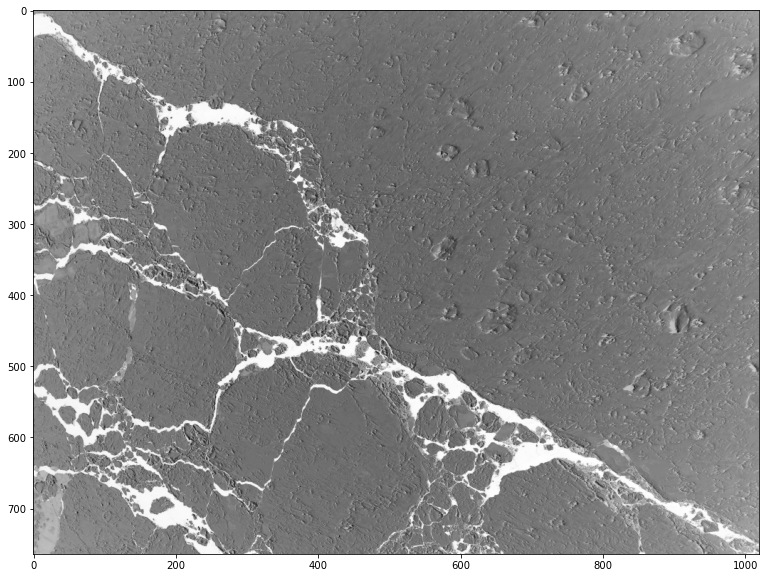

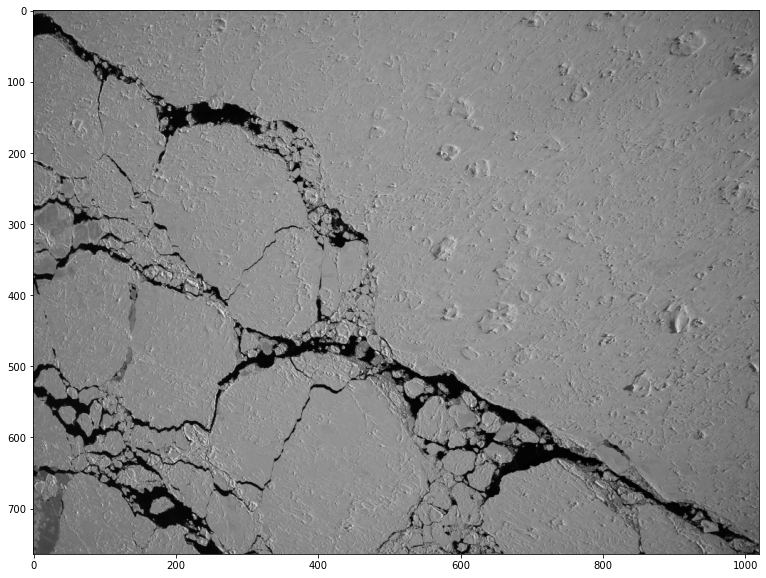

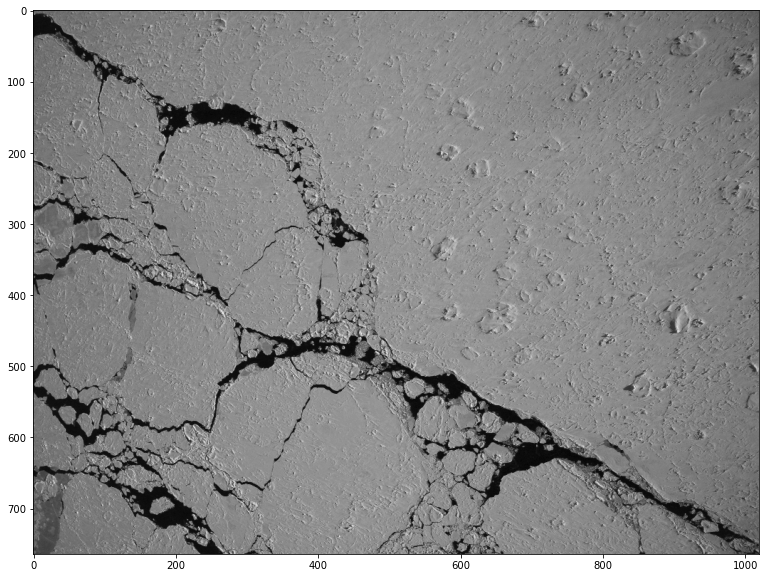

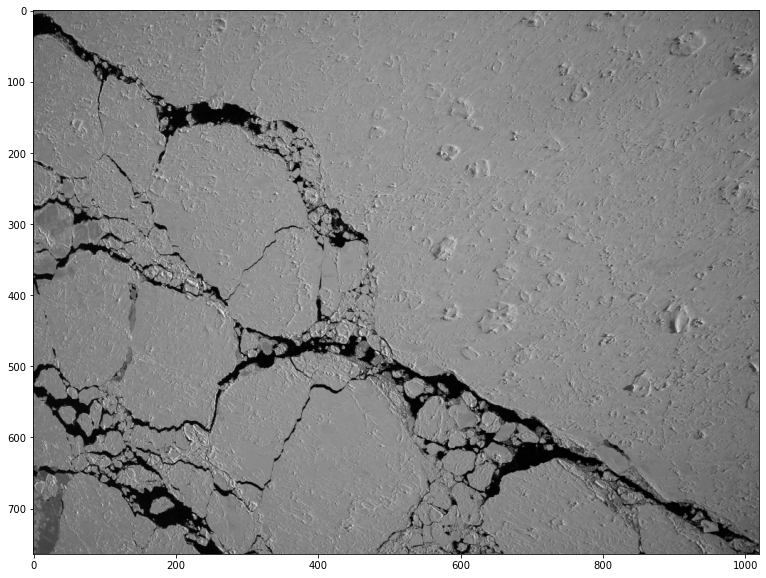

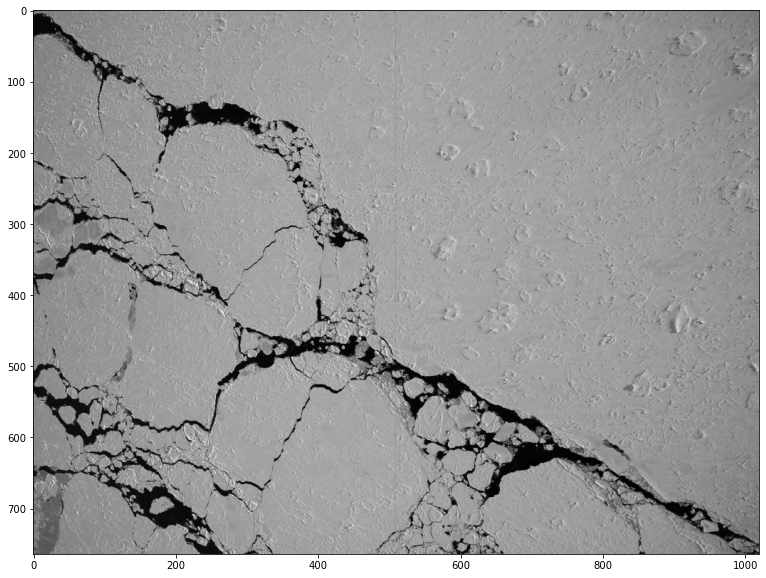

In [7]:
plt.imshow(inv, cmap='gray')
# plt.colorbar()
plt.show()
plt.imshow(gray, cmap='gray')
plt.show()
plt.imshow(im[:,:,0], cmap='gray')
plt.show()
plt.imshow(im[:,:,1], cmap='gray')
plt.show()
plt.imshow(im[:,:,2], cmap='gray')

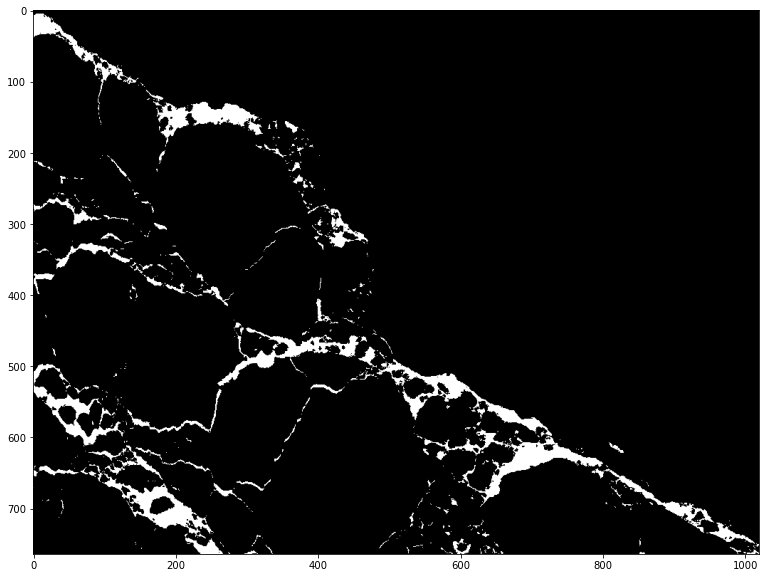

In [8]:
# minimum_threshold
minthresh = filters.threshold_minimum(gray)
minthresh = np.uint8(gray < minthresh)*255
plt.imshow(minthresh, cmap='gray')

In [9]:
# sure background area
sure_bg  = cv2.bitwise_not(minthresh) # simply the minimum thresholding, inverted so the the black shows sure background
# calculate the distance between the sure_bg
dist_transform = cv2.distanceTransform(sure_bg,cv2.DIST_L2,5)
# all local peaks in the distance transform 
_max = feature.corner_peaks(dist_transform, exclude_border=True)
print(_max.shape)

(1433, 2)


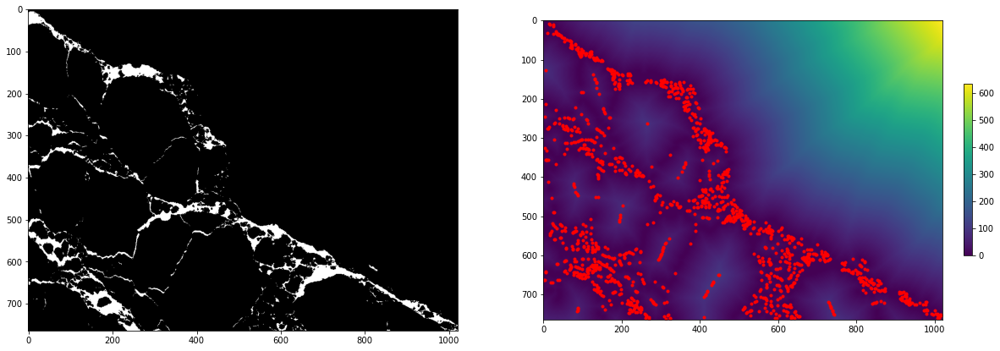

In [10]:
plt.subplot(121)
plt.imshow(minthresh, cmap='gray')
plt.subplot(122)
plt.imshow(dist_transform)
plt.colorbar(fraction=0.02)
plt.plot([p[1] for p in _max], [p[0] for p in _max], 'r.')

<AxesSubplot:xlabel='x', ylabel='y'>

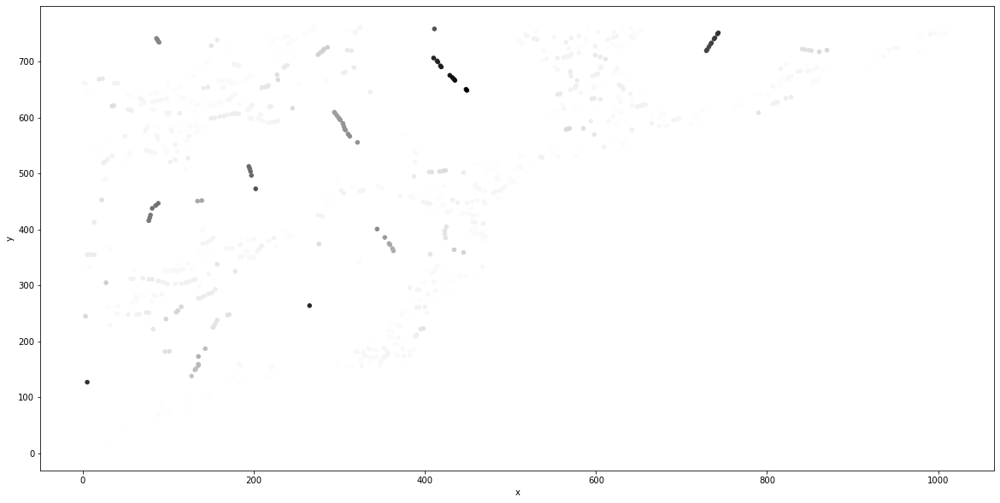

In [11]:
peaks = pd.DataFrame(_max, columns=['y','x'])
peaks['dist_to_surebg'] = dist_transform[peaks.y, peaks.x]
peaks.plot.scatter('x', 'y', c=peaks.dist_to_surebg)

Criteria for merging:

1. values must be close to each other. I.e., the distances from the sure water are close to each other.
2. also the distances from each other (peaks) must be close to each other.

Need to define what 'close' means in both cases.

Solution: 

- First address 1. Create a histogram of values where the width of each bin is adjusted so there are equal counts in each bin. The number of bins may be another hyperparameter to tune. 
- Then take the points in each bin, calculate the distance matrix for these points and then cluster them based on mutual distances (not sure how to address the last step). 

Shane's suggestion:

- Identify saddle points and join the water on either side.

In [ ]:
peaks.describe()

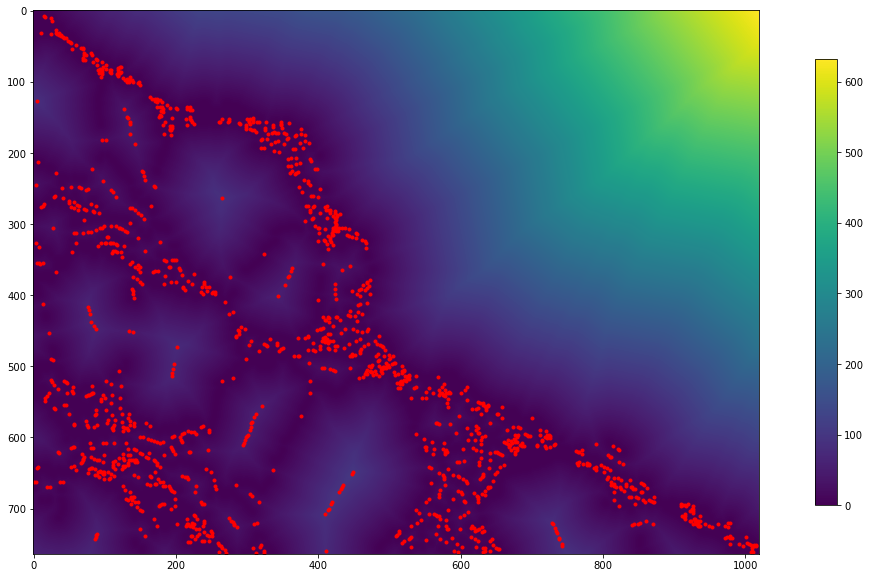

In [12]:
plt.imshow(dist_transform)
plt.colorbar(fraction=0.02)
plt.plot(peaks.x, peaks.y, 'r.')

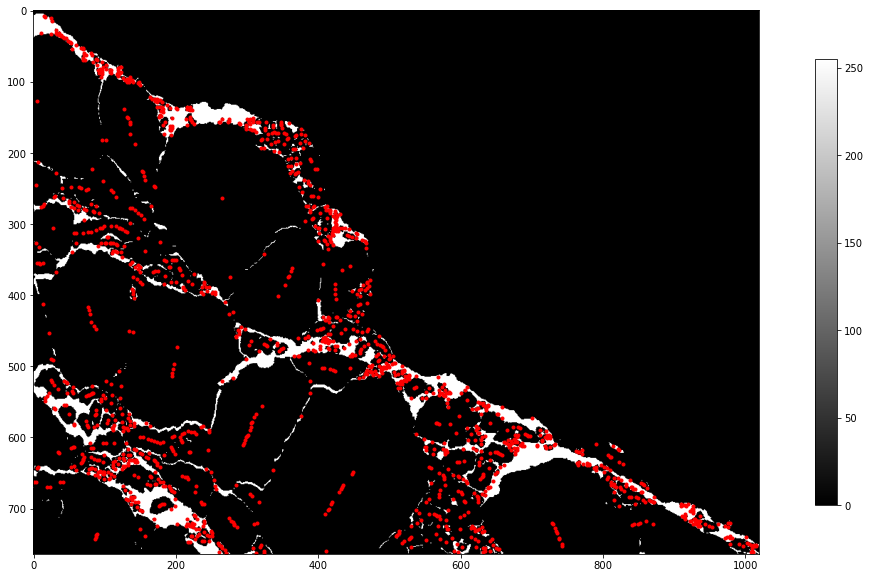

In [13]:
plt.imshow(minthresh, cmap='gray')
plt.colorbar(fraction=0.02)
plt.plot(peaks.x, peaks.y, 'r.')

In [14]:
dist_transform_hess_det = feature.hessian_matrix_det(dist_transform.astype('double'), approximate=False)
peaks['hess_det'] = dist_transform_hess_det[peaks.y,peaks.x]
peaks = peaks.where(peaks['hess_det'] > 0).dropna()

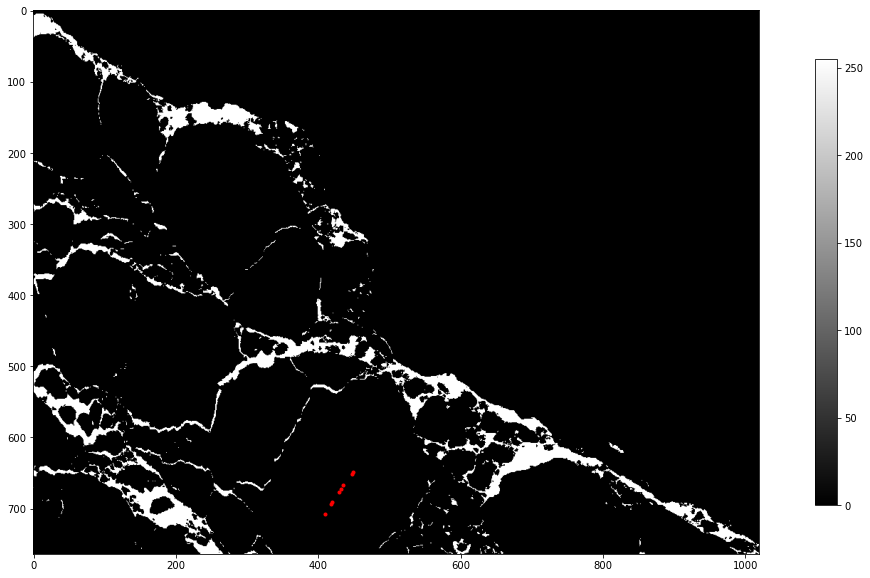

In [15]:
plt.imshow(minthresh, cmap='gray')
plt.colorbar(fraction=0.02)
plt.plot(peaks.x[:8], peaks.y[:8], 'r.')

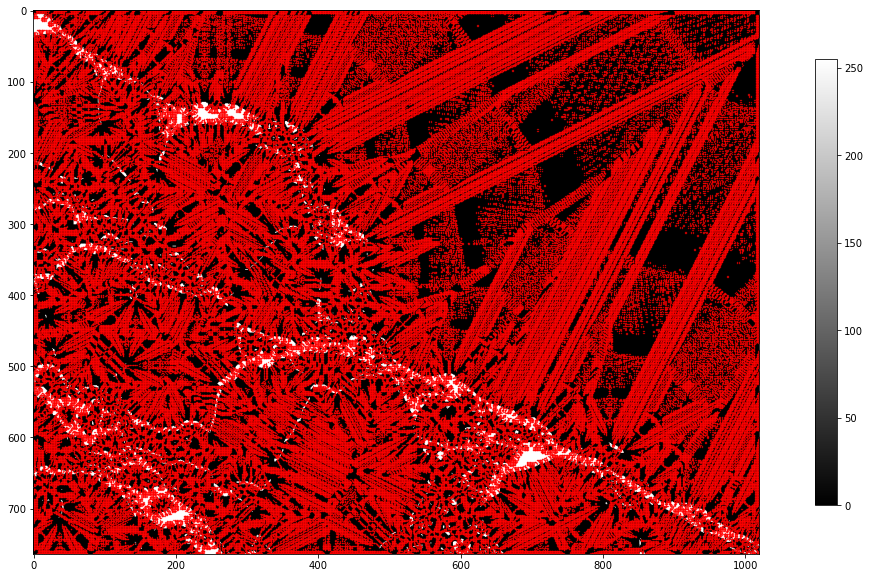

In [16]:
# saddles = list(zip(np.where(dist_transform_hess_det < 0)[0], np.where(dist_transform_hess_det < 0)[1]))
plt.imshow(minthresh, cmap='gray')
plt.colorbar(fraction=0.02)
plt.scatter(np.where(dist_transform_hess_det < 0)[1], np.where(dist_transform_hess_det < 0)[0], color='red', s=0.1)

In [17]:
len(peaks)

733

In [18]:
from scipy.spatial import distance_matrix

In [19]:
xy = np.array([xy for xy in zip(peaks.x, peaks.y)])
dist_mat = distance_matrix(xy, xy)

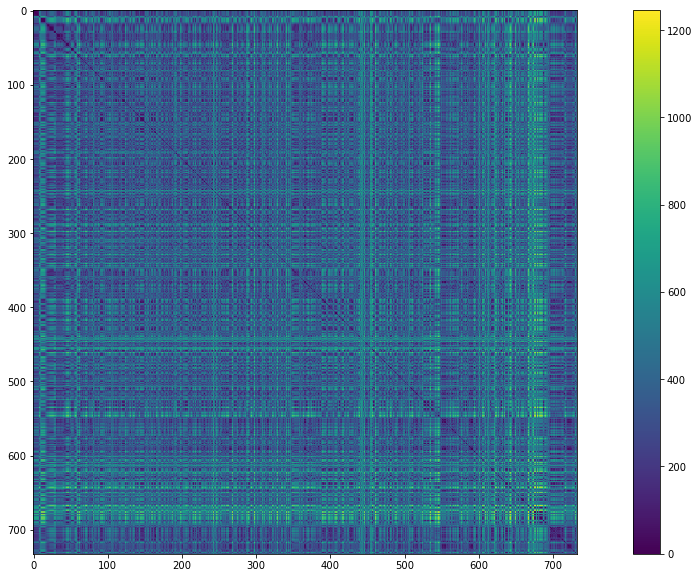

In [20]:
plt.imshow(dist_mat)
plt.colorbar()

In [21]:
dist_mat_nodiag = dist_mat.copy()
dist_mat_nodiag[dist_mat == 0] = np.nan
peaks['min_peak_dist'] = np.nanmin(dist_mat_nodiag, axis=0)
peaks = peaks.reset_index(drop=True)
peaks

,y,x,dist_to_surebg,hess_det,min_peak_dist
0,651.0,448.0,100.713181,0.053795,2.236068
1,649.0,449.0,100.669777,0.065637,2.236068
2,667.0,435.0,95.996956,0.030436,5.830952
3,672.0,432.0,95.200058,0.002334,5.000000
4,676.0,429.0,95.178337,0.038618,5.000000
...,...,...,...,...,...
728,363.0,146.0,1.000000,0.018488,4.472136
729,367.0,150.0,1.000000,0.001869,5.656854
730,638.0,661.0,1.000000,0.003435,6.708204
731,638.0,765.0,1.000000,0.056303,3.605551


In [22]:
peaks_to_merge = peaks[peaks.dist_to_surebg > peaks.min_peak_dist].copy()
peaks_to_merge = peaks_to_merge.reset_index()
peaks_to_merge.rename(columns = {'index': 'old_index'}, inplace=True)
peaks_to_merge.old_index = peaks_to_merge.old_index.astype('int')
peaks_to_merge[:20]

,old_index,y,x,dist_to_surebg,hess_det,min_peak_dist
0,0,651.0,448.0,100.713181,0.053795,2.236068
1,1,649.0,449.0,100.669777,0.065637,2.236068
2,2,667.0,435.0,95.996956,0.030436,5.830952
3,3,672.0,432.0,95.200058,0.002334,5.000000
4,4,676.0,429.0,95.178337,0.038618,5.000000
5,5,691.0,419.0,91.775230,0.002858,2.236068
6,6,693.0,418.0,91.300781,0.004344,2.236068
7,7,707.0,410.0,89.103882,0.016346,16.124515
8,10,750.0,742.0,84.362793,0.003755,7.615773
9,11,743.0,739.0,82.556602,0.001690,2.236068


In [23]:
xy = np.array([xy for xy in zip(peaks_to_merge.x, peaks_to_merge.y)])
dist_mat_to_merge = distance_matrix(xy, xy)

In [24]:
left=list(peaks_to_merge.index)
keep=[]
while len(left) > 0:
    # print(left[0])
    keep.append(left[0])
    drop = list(np.where(dist_mat_to_merge[keep[-1]] <= peaks_to_merge.iloc[keep[-1],3])[0])
    left = np.delete(left, np.in1d(left, drop))
peaks_merged = peaks_to_merge.iloc[keep] 
peaks_merged.set_index('old_index', drop=True, inplace=True)
peaks_merged

,y,x,dist_to_surebg,hess_det,min_peak_dist
old_index,,,,,
0,651.0,448.0,100.713181,0.053795,2.236068
10,750.0,742.0,84.362793,0.003755,7.615773
17,473.0,202.0,76.181419,0.181201,31.575307
18,759.0,411.0,75.787598,0.067427,52.009614
22,447.0,88.0,64.378304,0.138965,5.000000
...,...,...,...,...,...
517,287.0,426.0,2.800000,0.094168,2.236068
524,714.0,930.0,2.800000,0.001364,2.236068
525,315.0,419.0,2.800000,0.019787,2.236068


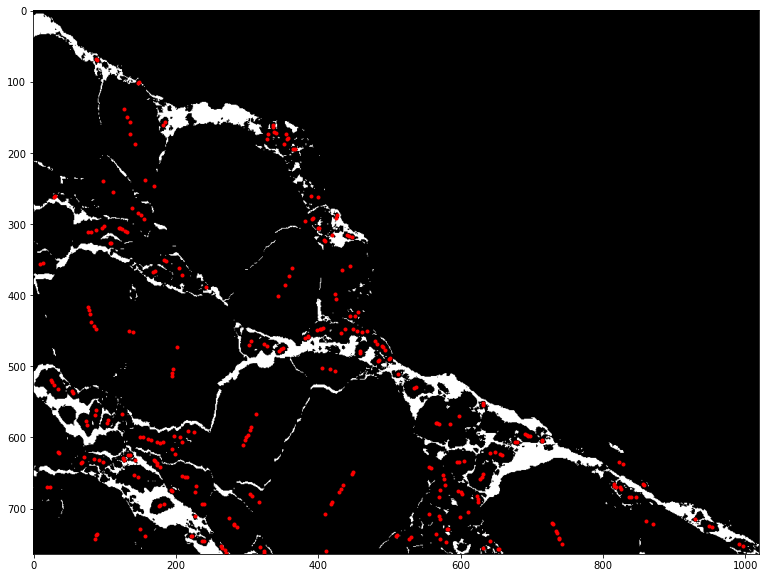

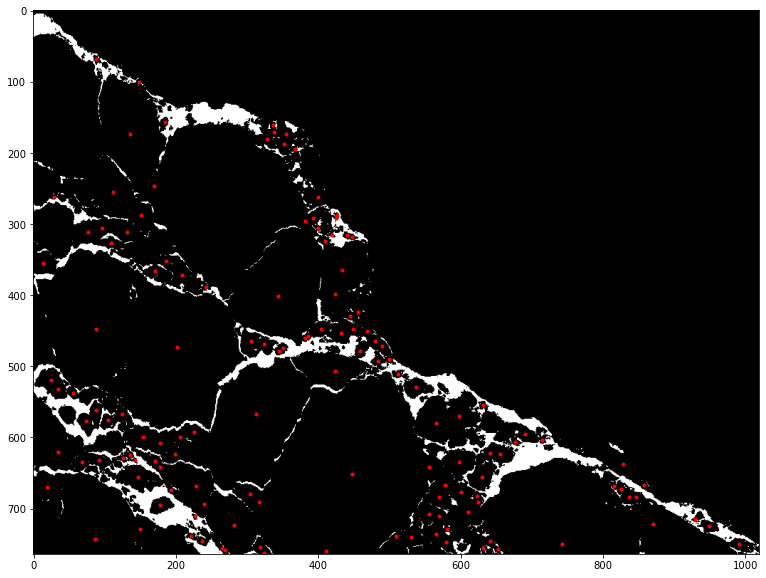

In [25]:
plt.imshow(minthresh, cmap='gray')
# plt.colorbar(fraction=0.02)
plt.plot(peaks_to_merge.x, peaks_to_merge.y, 'r.')
plt.show()
plt.imshow(minthresh, cmap='gray')
# plt.colorbar(fraction=0.02)
plt.plot(peaks_merged.x, peaks_merged.y, 'r.')

In [26]:
peaks_final = peaks[peaks.dist_to_surebg <= peaks.min_peak_dist]
# check if there are any overlapping rows between peaks_final and peaks_merged
print(np.any(np.in1d(list(peaks_merged.index), list(peaks_final.index))))
# merge peaks_merged into peaks_final
peaks_final = pd.concat([peaks_final, peaks_merged])
peaks_final.sort_values(by='dist_to_surebg', ascending=False,inplace=True)
peaks_final

False


,y,x,dist_to_surebg,hess_det,min_peak_dist
0,651.0,448.0,100.713181,0.053795,2.236068
8,264.0,265.0,87.488380,0.077641,89.810912
9,127.0,5.0,84.796944,0.015861,89.140339
10,750.0,742.0,84.362793,0.003755,7.615773
17,473.0,202.0,76.181419,0.181201,31.575307
...,...,...,...,...,...
718,668.0,255.0,1.000000,0.004366,27.000000
719,286.0,431.0,1.000000,0.001072,5.000000
720,460.0,406.0,1.000000,0.018951,4.123106
721,432.0,415.0,1.000000,0.002136,2.236068


(array([532.,  15.,   4.,   3.,   4.]),
 array([  1.      ,  20.942636,  40.885273,  60.827908,  80.770546,
        100.71318 ], dtype=float32),
 <BarContainer object of 5 artists>)

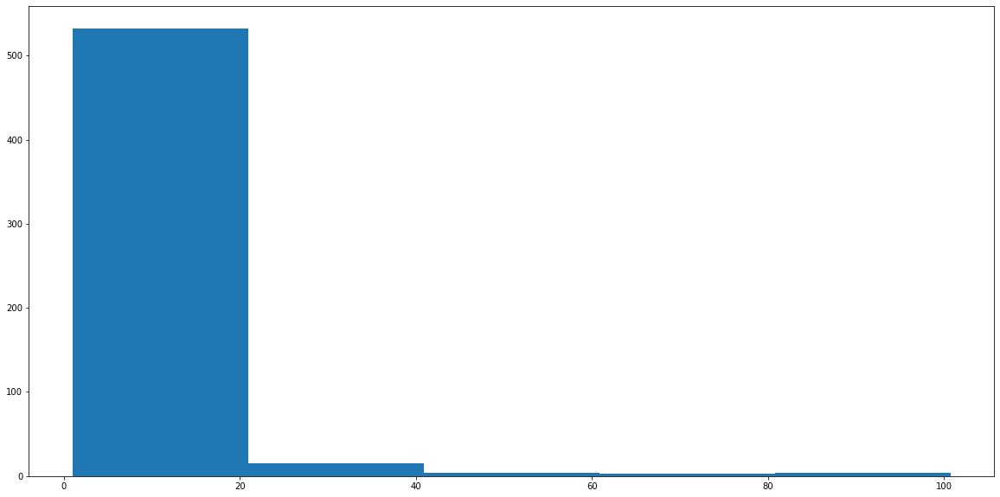

In [27]:
plt.hist(peaks_final.dist_to_surebg,bins=5)

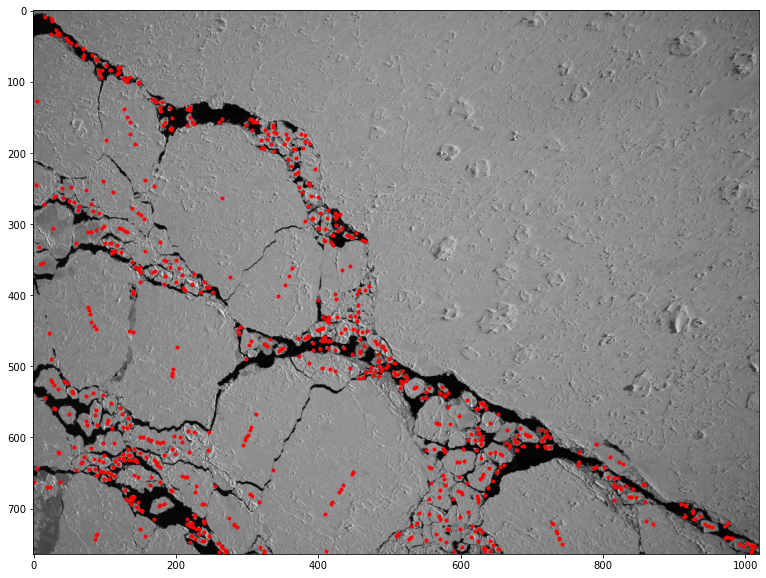

In [28]:
plt.imshow(gray, cmap='gray')
plt.plot(peaks.x, peaks.y, 'r.')

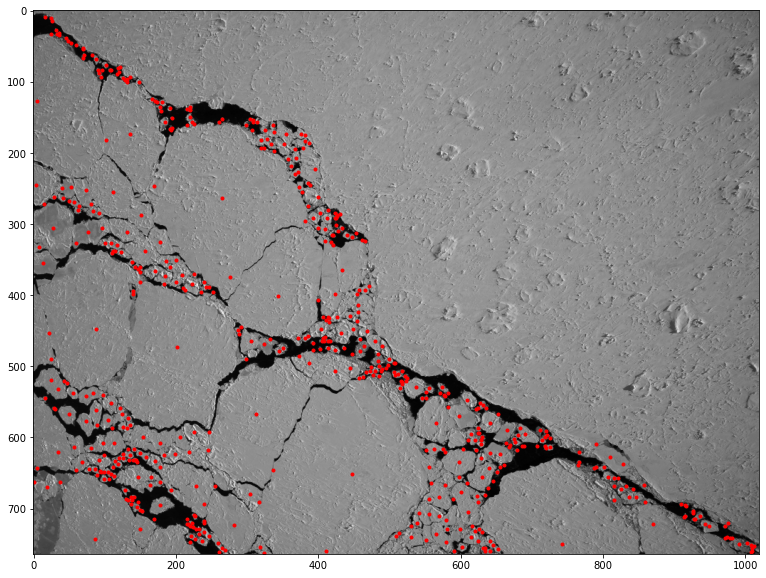

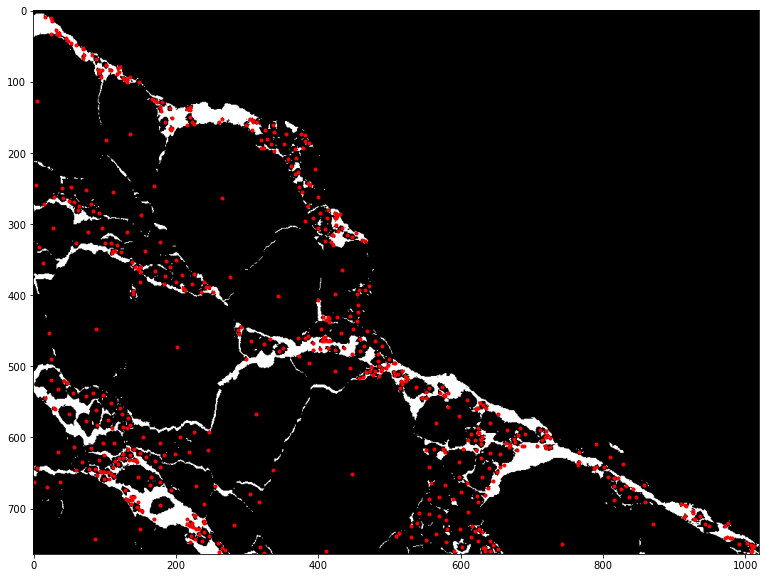

In [29]:
plt.imshow(gray, cmap='gray')
plt.plot(peaks_final.x, peaks_final.y, 'r.')
plt.show()
plt.imshow(minthresh, cmap='gray')
plt.plot(peaks_final.x, peaks_final.y, 'r.')

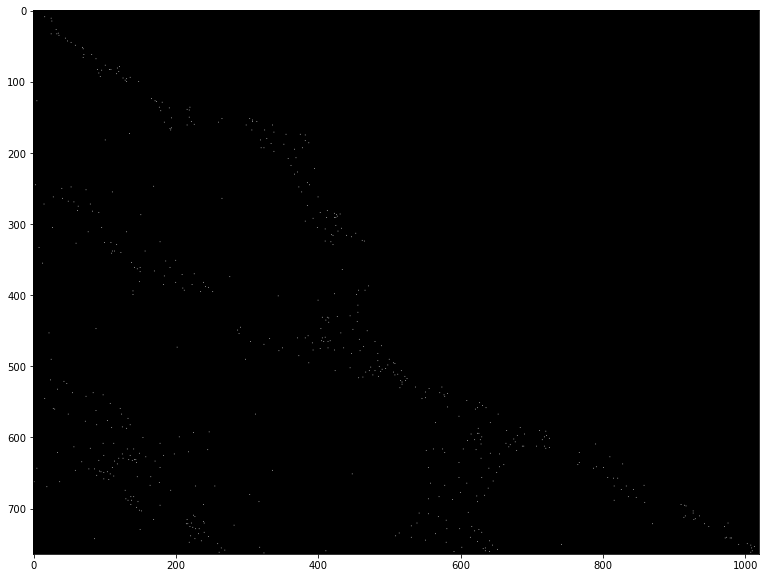

In [30]:
# sure background area
sure_bg  = cv2.bitwise_not(minthresh)
# sure foreground area
sure_fg = np.zeros(dist_transform.shape)
for p in range(len(peaks_final)):
    # print(_max[p,0], _max[p,1])
    sure_fg[int(peaks_final.y.iloc[p]), int(peaks_final.x.iloc[p])] = 255.
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)
plt.imshow(sure_fg, cmap='gray')

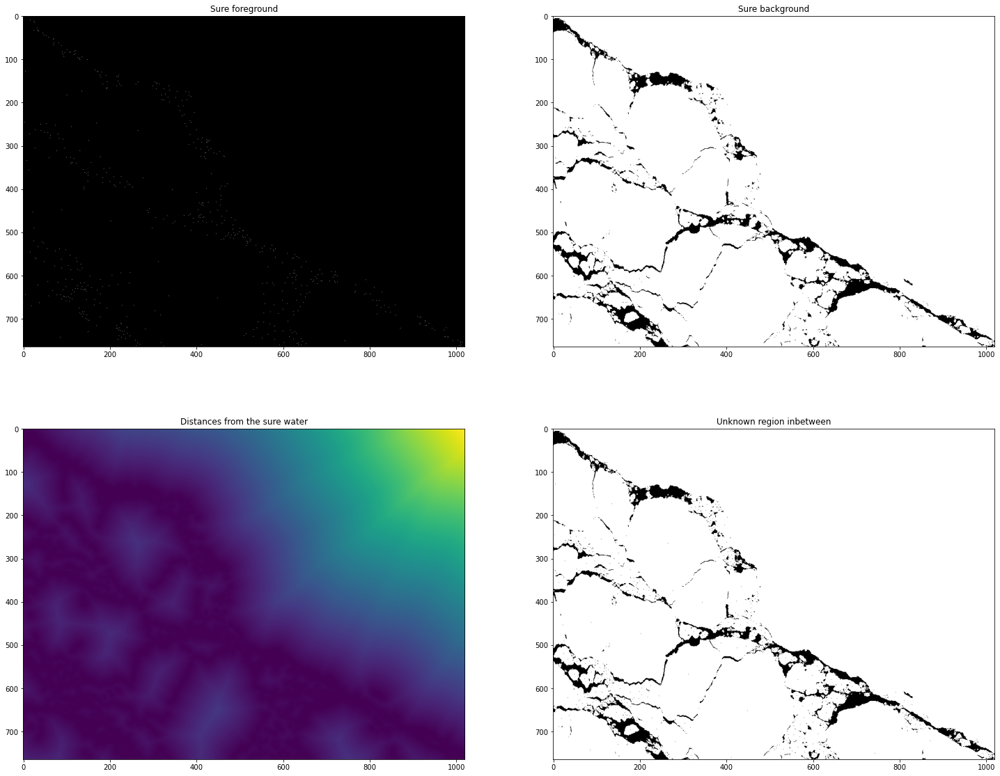

In [31]:
plt.figure(figsize=[25,20])
plt.subplot(2,2,1)
plt.title("Sure foreground")
plt.imshow(sure_fg, cmap='gray')
plt.subplot(2,2,2)
plt.title("Sure background")
plt.imshow(sure_bg, cmap='gray')
plt.subplot(2,2,3)
plt.imshow(dist_transform)
plt.title('Distances from the sure water')
plt.subplot(2,2,4)
plt.title("Unknown region inbetween")
plt.imshow(unknown, cmap='gray')

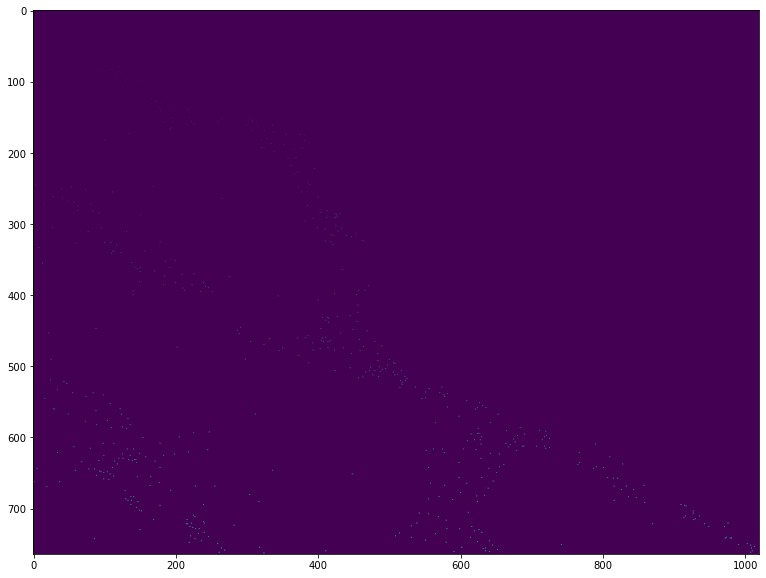

In [32]:
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# # Now, mark the region of unknown with zero
markers[unknown==255] = 0
plt.imshow(markers)

In [33]:
markers = cv2.watershed(im,markers)
imcopy = im.copy()
imcopy[markers == -1] = [255,0,0]

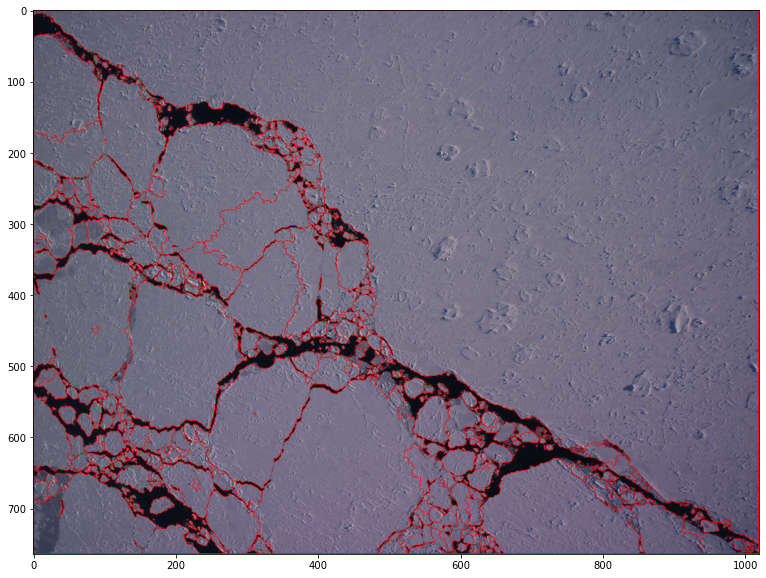

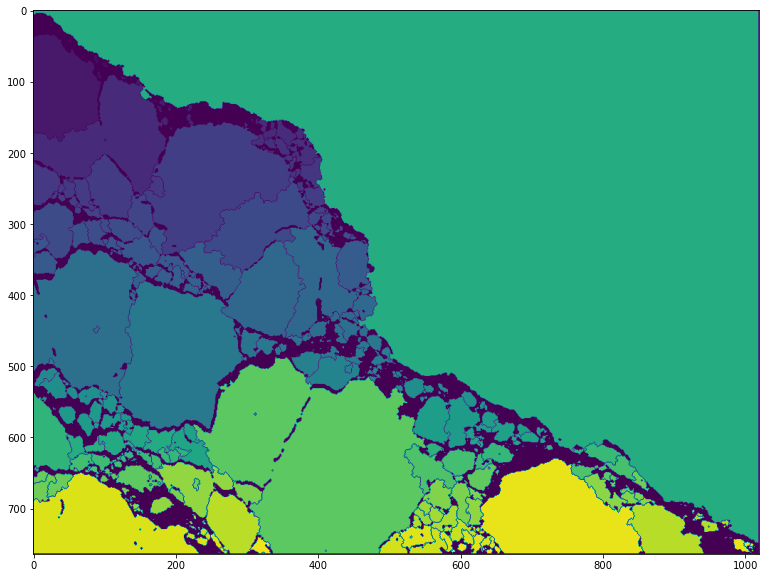

In [34]:
plt.imshow(imcopy)
plt.show()
plt.imshow(markers)
plt.show()

In [35]:
def marker_area(markers):
    marks = np.unique(markers)
    return [np.sum(markers == mark) for mark in marks]

marker_areas = marker_area(markers)
sorted_markers = np.argsort(marker_areas[3:])+3
marker_areas[:10], sorted_markers

([24671, 24, 44918, 1, 1, 2, 1, 1, 1, 4],
 array([  3, 353, 107, 352, 351, 350, 348, 105, 346, 340, 337, 116, 335,
        119, 327, 113, 354, 365, 369, 429,  80, 417,  82, 414, 413, 412,
        184, 401, 399, 398, 397, 392, 375, 372, 326, 430, 324, 126, 236,
        230, 225, 215, 157, 212, 238, 210, 197, 163, 195, 165, 190, 188,
        198, 148, 244, 250, 295, 292, 286, 285, 283, 559, 273, 135, 271,
        269, 260, 257, 255, 251, 143, 306, 434, 411, 444, 544,  30, 535,
        531,  33,  34,  28,  35, 529,  38, 441, 527,  41, 526,  36,  27,
         26,  25,   4,   6,   7,   8, 556,  10,  13,  14,  15,  16,  17,
         18, 554, 553,  23, 519, 509, 528, 504, 445, 459, 460, 464, 465,
        471, 473,  66,  65,  64, 506,  60,  59, 488,  57, 179, 495,  52,
         49, 489,  51,  56, 494,   5, 510, 330, 232,  11, 211, 472, 185,
        122, 229, 287, 481, 356, 376, 270, 384, 386, 300,  24, 552, 246,
        245, 219, 555, 478, 389, 503, 524, 405, 360, 366, 548, 482, 560,
         

550

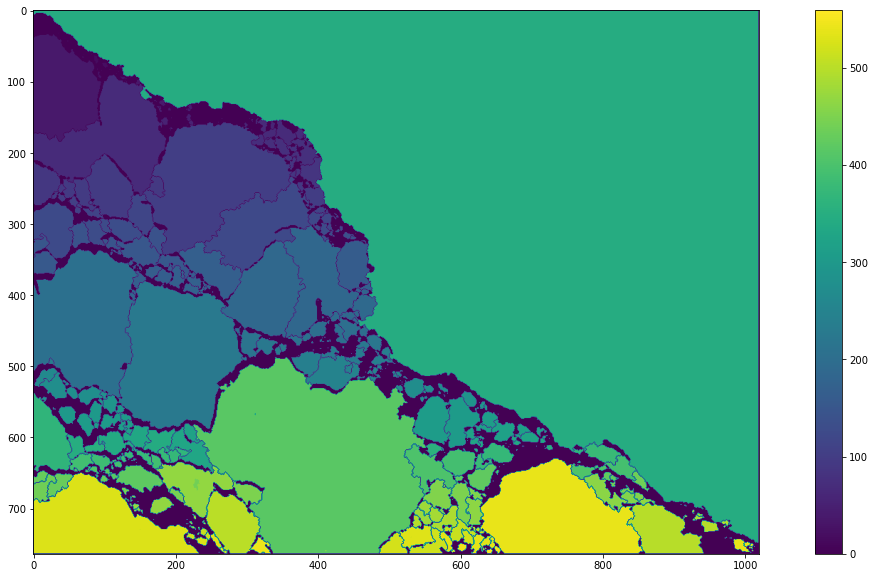

In [36]:
markcopy = np.zeros(markers.shape, np.uint16)
for m in sorted_markers:
    # print(m)
    tmp = np.zeros(markers.shape, np.uint8)
    tmp[markers == m] = 255
    cont, tree = cv2.findContours(tmp,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
    # plt.imshow(cv2.drawContours(tmp, cont, 0, 255, cv2.FILLED), cmap='gray')
    # plt.show()
    markcopy = cv2.drawContours(markcopy, cont, 0, int(m), cv2.FILLED)

plt.imshow(markcopy)
plt.colorbar()
len(np.unique(markcopy)-1)


In [37]:
dist_transform_cp = dist_transform.copy()
summary(dist_transform_cp)

(632.25543, 0.0, 316.1277160644531)

In [38]:
dist_transform_inverse = dist_transform_cp*-1. + dist_transform_cp.max()#util.invert(dist_transform) - 1.#/dist_transform.max()*(2**16 - 1))
summary(dist_transform_inverse)

(632.25543, 0.0, 316.1277160644531)

### Binned threshold approach to finding contours manually



In [ ]:
dmax = dist_transform_cp.max()
thresh = dmax-25
contours = measure.find_contours(dist_transform_cp, 25,positive_orientation='high')
fig, ax = plt.subplots()
ax.imshow(gray, cmap='gray')
for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2)
ax.axis('Image')
ax.set_xticks([])
ax.set_yticks([])
plt.show()
len(contours)

In [39]:
sure_fg_list = []
dist_transform_list = [dist_transform_cp]
dt_fg_list = []

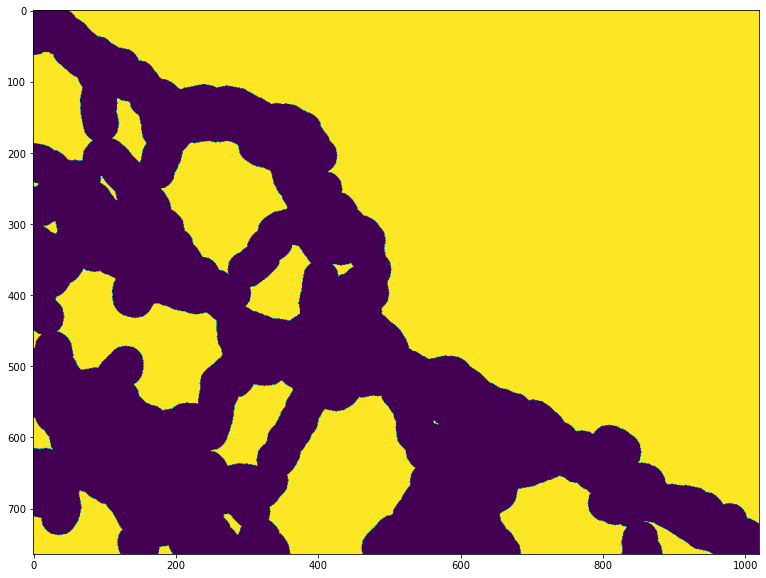

(91.3442, 0.0, 45.67210006713867)


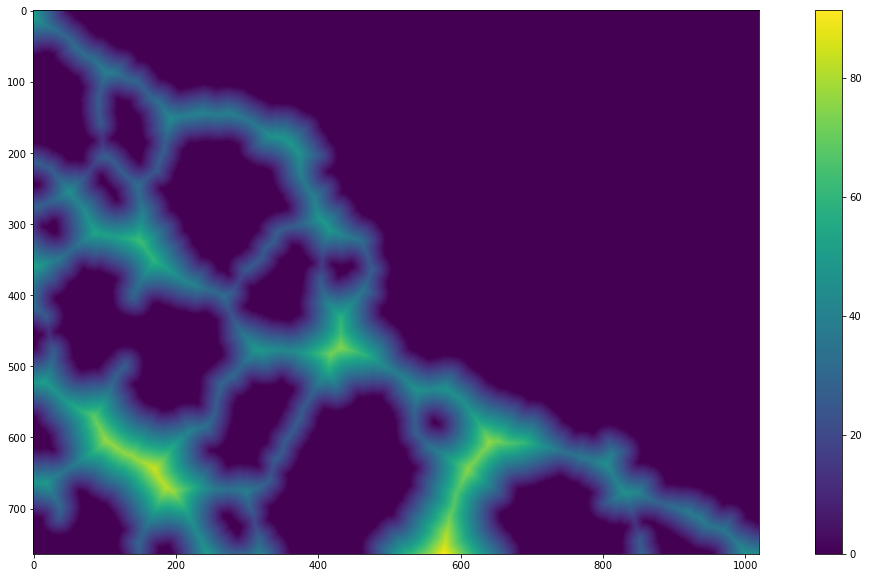

13


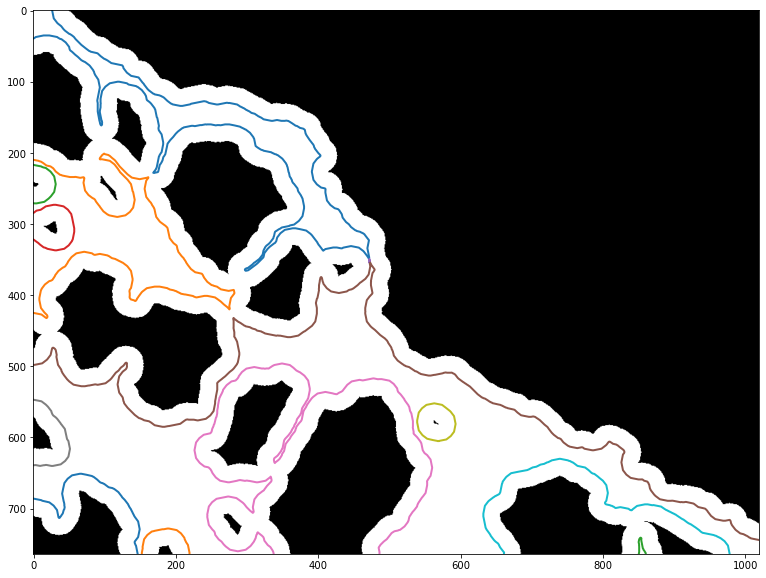

In [40]:
sure_fg_list.append(np.zeros(gray.shape))
sure_fg_list[-1][dist_transform_list[-1] > 25] = 255.
sure_fg_inv = sure_fg_list[-1].copy()
sure_fg_inv = np.uint8(sure_fg_inv*-1. + 255.)
plt.imshow(sure_fg_list[-1])
plt.show()
dt_fg_list.append(cv2.distanceTransform(sure_fg_inv,cv2.DIST_L2,5))
print(summary(dt_fg_list[-1]))
plt.imshow(dt_fg_list[-1])
plt.colorbar()
plt.show()
contours = measure.find_contours(dt_fg_list[-1],24,fully_connected='low',positive_orientation='low')
print(len(contours))
plt.imshow(util.invert(sure_fg_list[-1]), cmap='gray')
for contour in contours:
    plt.plot(contour[:, 1], contour[:, 0], linewidth=2)

(24.165895, 0.0, 12.082947731018066)


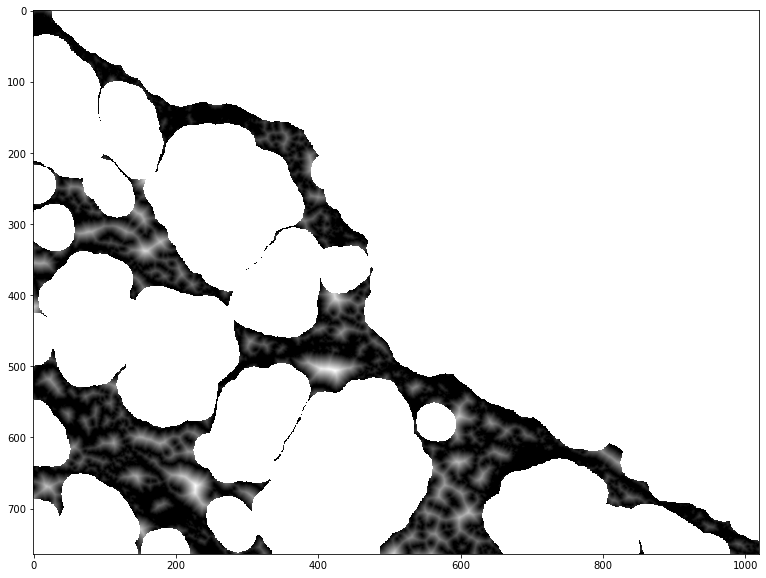

In [41]:
dist_transform_list.append(dist_transform_list[-1])
dist_transform_list[-1][dt_fg_list[-1] <= 24] = np.nan
print(summary(dist_transform_list[-1]))
plt.imshow(dist_transform_list[-1], cmap='gray')

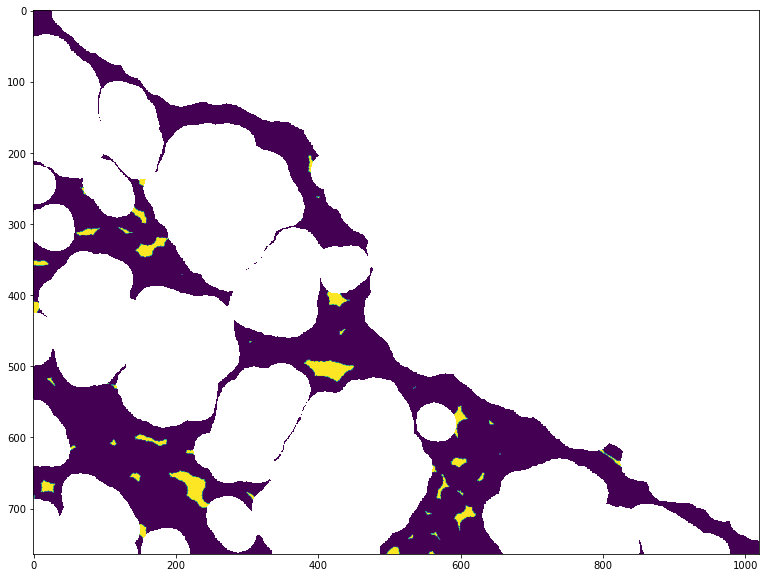

(43.741093, 0.0, 21.870546340942383)


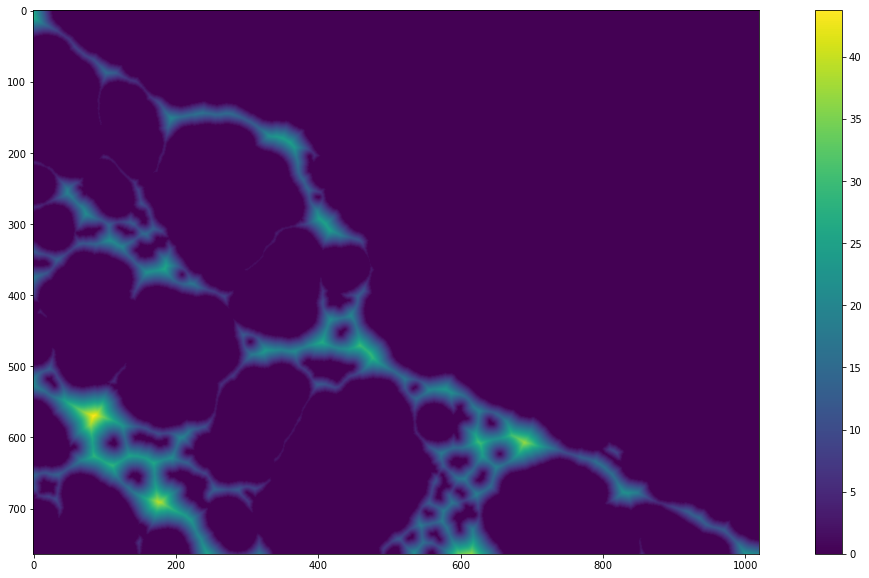

30


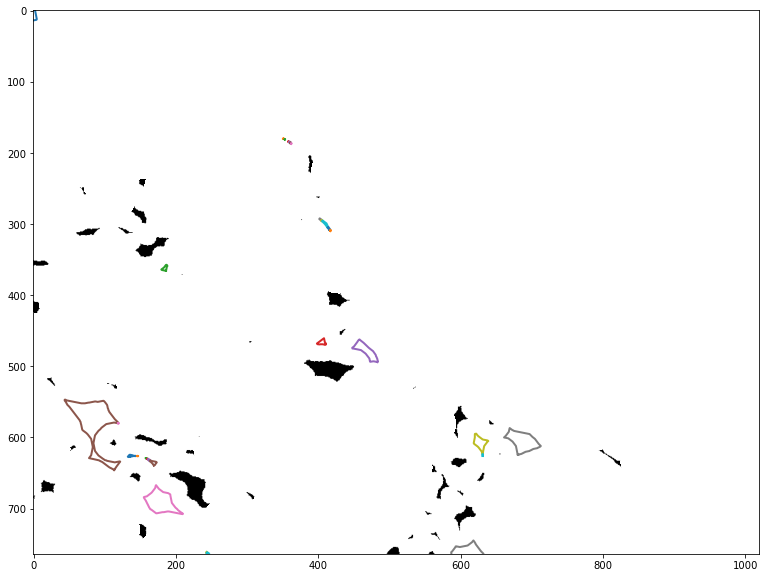

In [42]:
sure_fg_list.append(np.zeros(gray.shape))
sure_fg_list[-1][dist_transform_list[-1] > 12] = 255.
sure_fg_list[-1][dt_fg_list[-1] <= 24] = np.nan
sure_fg_inv = sure_fg_list[-1].copy()
sure_fg_inv = np.uint8(sure_fg_inv*-1. + 255.)
plt.imshow(sure_fg_list[-1])
plt.show()
dt_fg_list.append(cv2.distanceTransform(sure_fg_inv,cv2.DIST_L2,5))
print(summary(dt_fg_list[-1]))
plt.imshow(dt_fg_list[-1])
plt.colorbar()
plt.show()
contours = measure.find_contours(dt_fg_list[-1],11,fully_connected='low',positive_orientation='low')
print(len(contours))
plt.imshow(util.invert(sure_fg_list[-1]), cmap='gray')
for contour in contours:
    plt.plot(contour[:, 1], contour[:, 0], linewidth=2)

(11.984499, 0.0, 5.992249488830566)


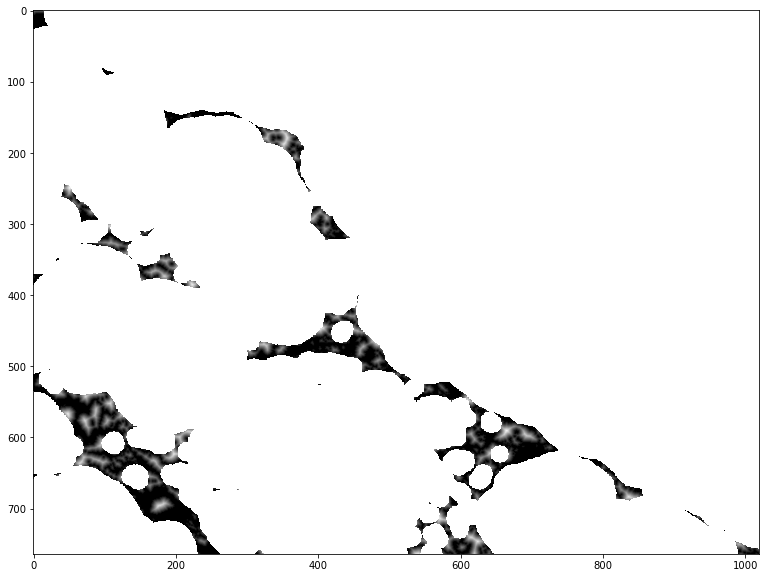

In [43]:
dist_transform_list.append(dist_transform_list[-1])
dist_transform_list[-1][dt_fg_list[-1] <= 11] = np.nan
print(summary(dist_transform_list[-1]))
plt.imshow(dist_transform_list[-1], cmap='gray')

165


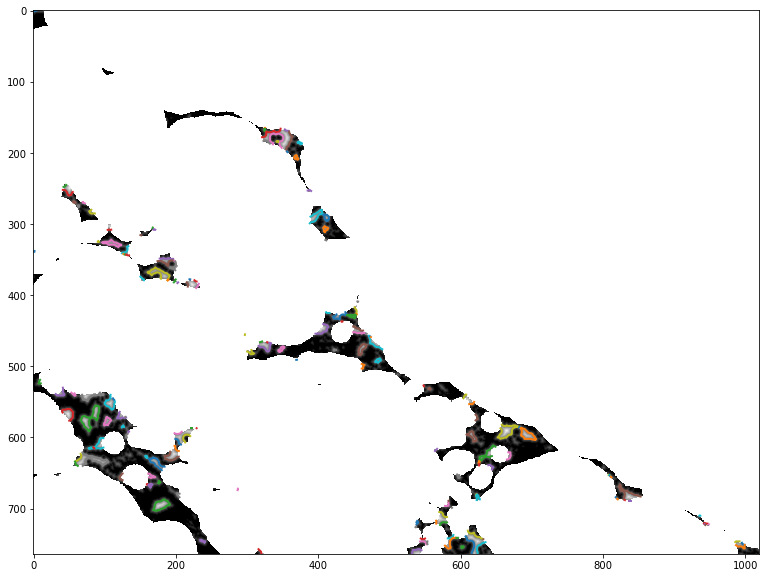

In [44]:
contours = measure.find_contours(dist_transform_list[-1],5,fully_connected='low',positive_orientation='low')
print(len(contours))
plt.imshow(dist_transform_list[-1], cmap='gray')
for contour in contours:
    plt.plot(contour[:, 1], contour[:, 0], linewidth=2)

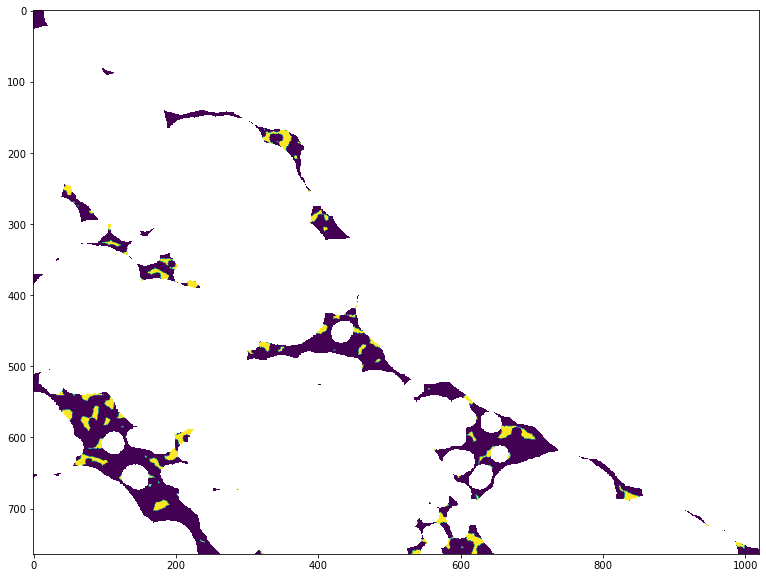

(17.181398, 0.0, 8.590699195861816)


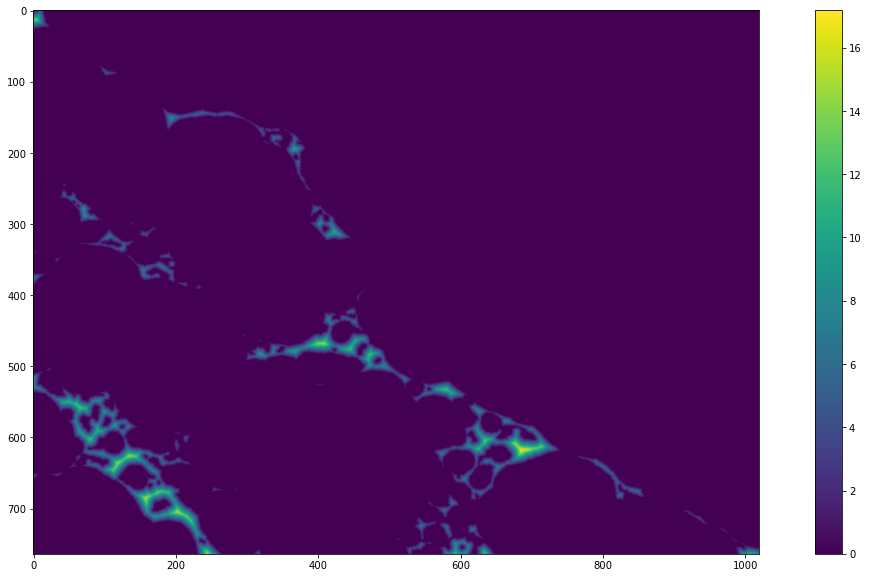

104


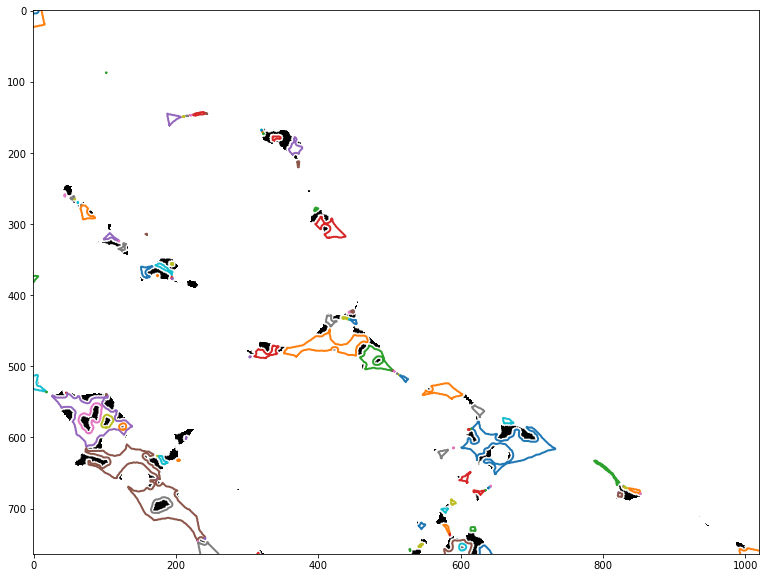

In [53]:
sure_fg_list.append(np.zeros(gray.shape))
sure_fg_list[-1][dist_transform_list[-1] > 5] = 255.
sure_fg_list[-1][dt_fg_list[-1] <= 11] = np.nan
sure_fg_inv = sure_fg_list[-1].copy()
sure_fg_inv = np.uint8(sure_fg_inv*-1. + 255.)
plt.imshow(sure_fg_list[-1])
plt.show()
dt_fg_list.append(cv2.distanceTransform(sure_fg_inv,cv2.DIST_L2,5))
print(summary(dt_fg_list[-1]))
plt.imshow(dt_fg_list[-1])
plt.colorbar()
plt.show()
contours = measure.find_contours(dt_fg_list[-1],4,fully_connected='low',positive_orientation='low')
print(len(contours))
plt.imshow(util.invert(sure_fg_list[-1]), cmap='gray')
for contour in contours:
    plt.plot(contour[:, 1], contour[:, 0], linewidth=2)

(5.0, 0.0, 2.5)


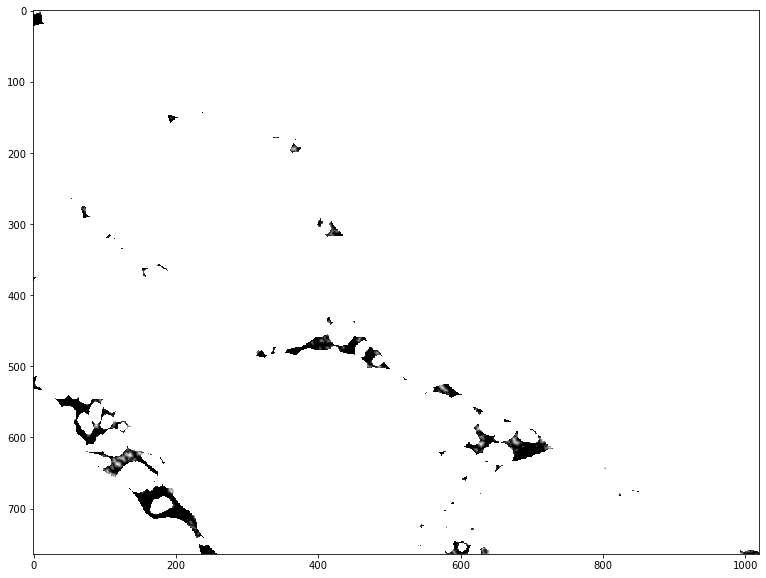

In [54]:
dist_transform_list.append(dist_transform_list[-1])
dist_transform_list[-1][dt_fg_list[-1] <= 4] = np.nan
print(summary(dist_transform_list[-1]))
plt.imshow(dist_transform_list[-1], cmap='gray')

In [55]:
sure_fg_list.append(np.zeros(gray.shape))
sure_fg_list[-1][dist_transform_list[-1] > 2] = 255.
sure_fg_list[-1][dt_fg_list[-1] <= 4] = np.nan

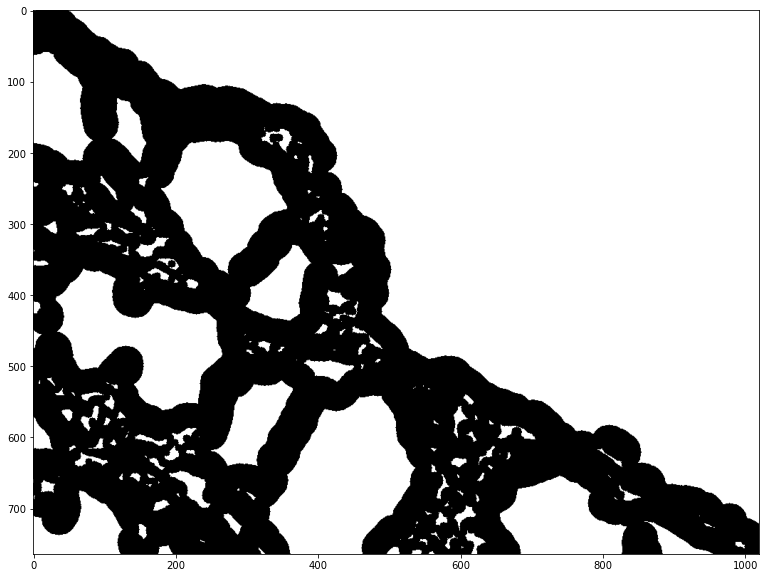

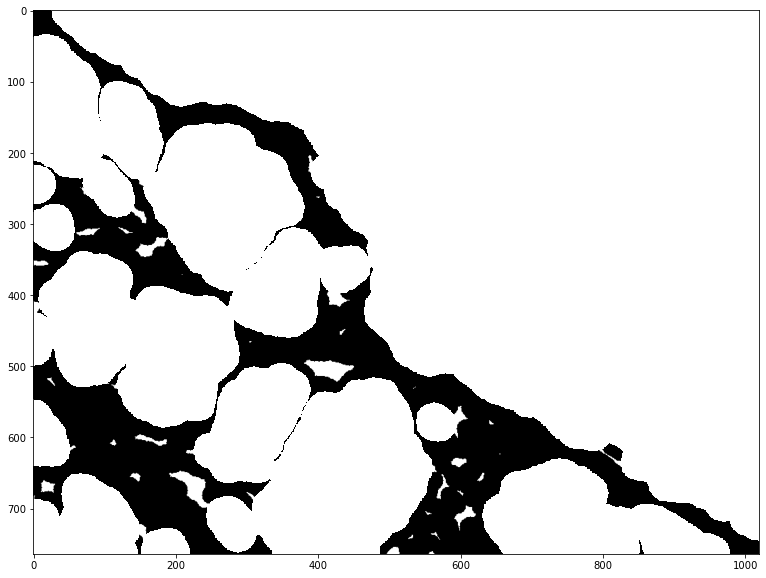

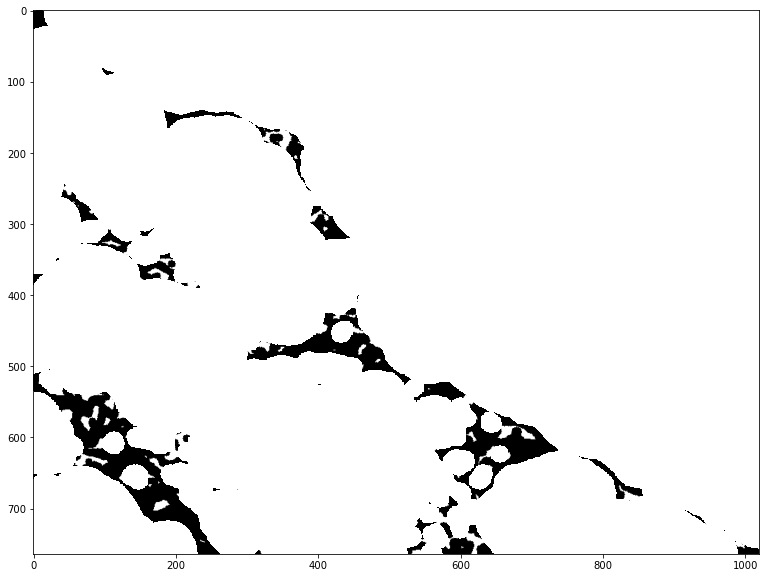

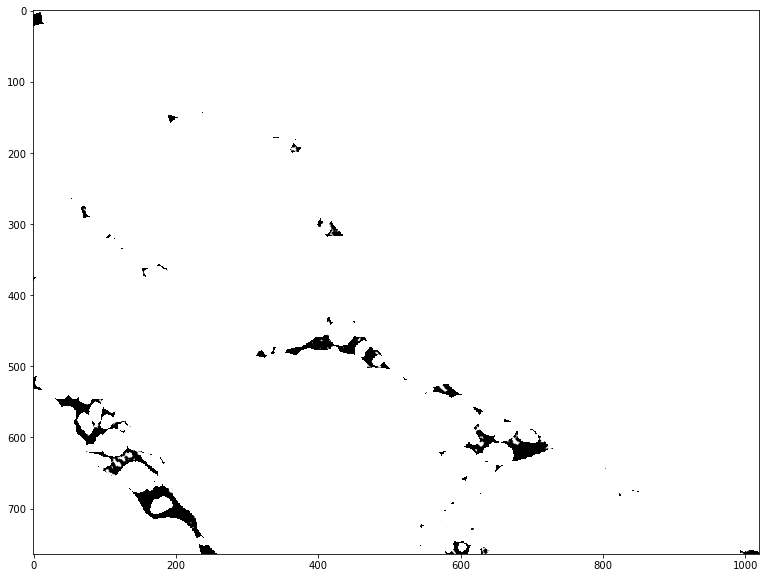

In [56]:
plt.imshow(sure_fg_list[0], cmap='gray')
plt.show()
plt.imshow(sure_fg_list[1], cmap='gray')
plt.show()
plt.imshow(sure_fg_list[2], cmap='gray')
plt.show()
plt.imshow(sure_fg_list[3], cmap='gray')

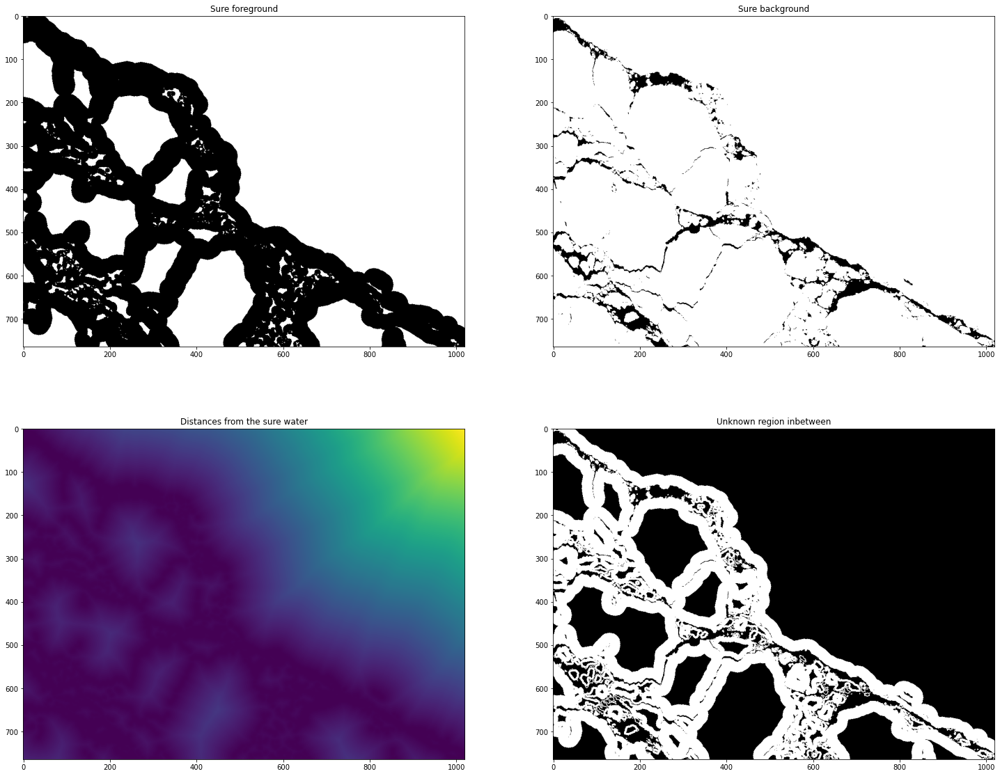

In [57]:
# sure background area
sure_bg  = cv2.bitwise_not(minthresh)
# sure foreground area
sure_fg_final = sure_fg_list[0]
sure_fg_final[sure_fg_list[1] == 255.] = 255.
sure_fg_final[sure_fg_list[2] == 255.] = 255.
sure_fg_final[sure_fg_list[3] == 255.] = 255.
sure_fg_final = np.uint8(sure_fg_final)
# unknown area
unknown = cv2.subtract(sure_bg,sure_fg_final)
# plotting
plt.figure(figsize=[25,20])
plt.subplot(2,2,1)
plt.title("Sure foreground")
plt.imshow(sure_fg_final, cmap='gray')
plt.subplot(2,2,2)
plt.title("Sure background")
plt.imshow(sure_bg, cmap='gray')
plt.subplot(2,2,3)
plt.imshow(dist_transform)
plt.title('Distances from the sure water')
plt.subplot(2,2,4)
plt.title("Unknown region inbetween")
plt.imshow(unknown, cmap='gray')

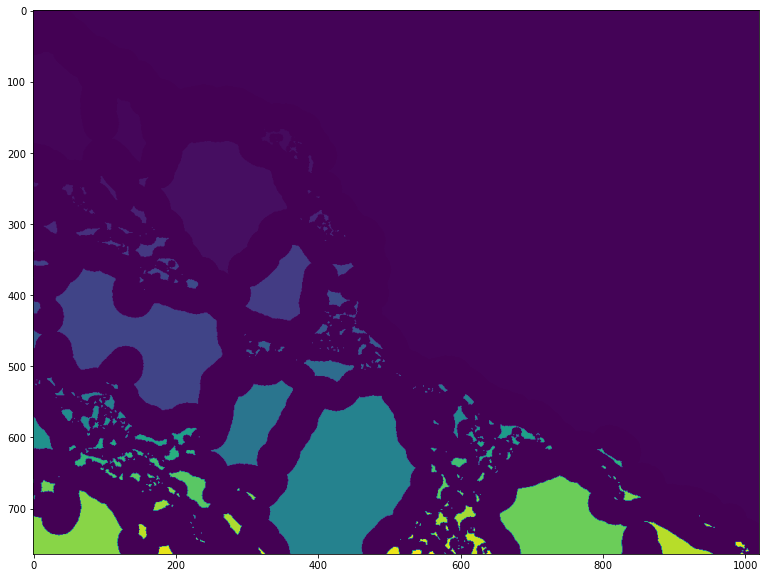

In [58]:
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg_final)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# # Now, mark the region of unknown with zero
markers[unknown==255] = 0
plt.imshow(markers)

In [59]:
markers = cv2.watershed(im,markers)
imcopy = im.copy()
imcopy[markers == -1] = [255,0,0]

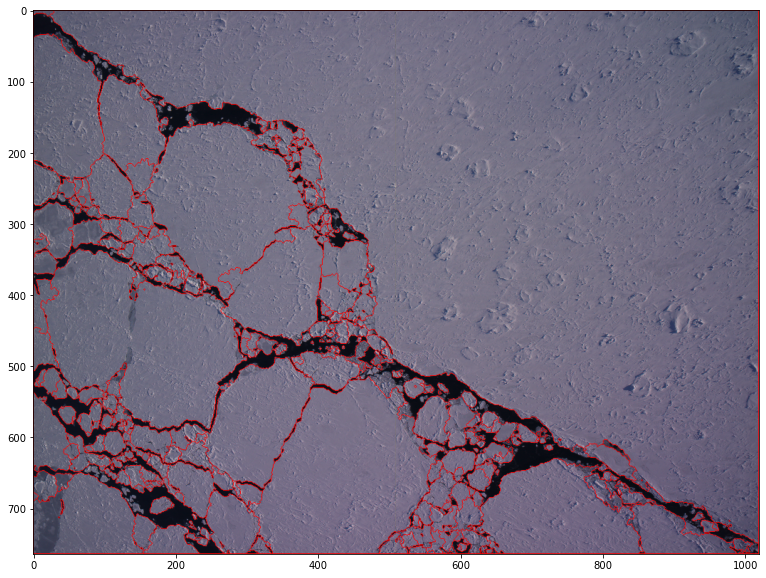

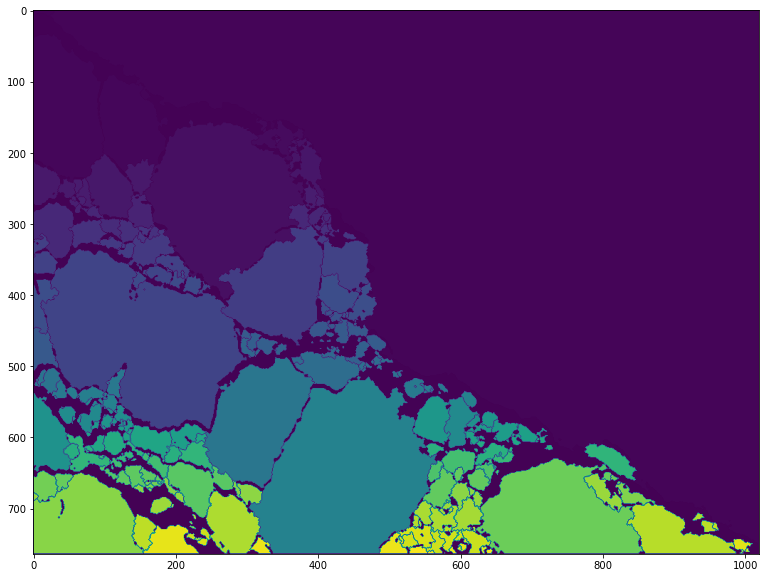

In [60]:
plt.imshow(imcopy)
plt.show()
plt.imshow(markers)
plt.show()

In [ ]:
dist_transform_cp[dt_fg <= 11] = np.nan
print(summary(dist_transform_cp))
plt.imshow(dist_transform_cp, cmap='gray')

In [ ]:
sure_fg[(dist_transform_old <= 25) & (dist_transform_old > 12)] = 255.
plt.imshow(sure_fg, cmap='gray')

In [ ]:
contours = measure.find_contours(dist_transform_cp,12, positive_orientation='high')#, mask=dist_transform_cp <= 25)
fig, ax = plt.subplots()
ax.imshow(dist_transform_cp, cmap='gray')
for contour in contours:
    ax.plot(contour[:, 1], contour[:, 0], linewidth=2)
ax.axis('Image')
ax.set_xticks([])
ax.set_yticks([])
plt.show()

In [ ]:
dist_transform_inverse[dist_transform_inverse < ] = np.nan
print(summary(dist_transform_inverse))

# Exploratory

In [ ]:
im.shape

In [ ]:
plt.imshow(gray, cmap='gray')

In [ ]:
grayinv = util.invert(gray)
plt.imshow(grayinv, cmap='gray')

In [ ]:
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
print(ret)
plt.imshow(thresh, cmap='gray')
np.unique(thresh)

In [ ]:
# noise removal
kernel = np.ones((2,2),np.uint8)
# dilate1 = cv2.dilate(thresh,kernel,iterations=10)
# kernel = np.ones((3,3),np.uint8)
# opening = cv2.morphologyEx(minthresh,cv2.MORPH_OPEN,kernel, iterations = 0)
# sure foreground area
sure_fg =  cv2.bitwise_not(cv2.dilate(minthresh,kernel,iterations=45)) # dilate until the disconnected water channels are connected
# sure background area
sure_bg  = cv2.bitwise_not(minthresh) # simply the minimum thresholding, inverted so the the black shows sure background
# dist_transform = cv2.distanceTransform(minthresh,cv2.DIST_L2,3)
# ret, sure_fg = cv2.threshold(dist_transform,0.03*dist_transform.max(),255,0)
# Finding unknown region
# sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

In [ ]:
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# # Now, mark the region of unknown with zero
markers[unknown==255] = 0
plt.imshow(markers)

In [ ]:
markers = cv2.watershed(im,markers)
imcopy = im.copy()
imcopy[markers == -1] = [255,0,0]

In [ ]:
plt.imshow(imcopy)
plt.show()
plt.imshow(markers)
plt.show()

#### Try sure foreground using distance based method

In [ ]:
# sure background area
sure_bg  = cv2.bitwise_not(minthresh) # simply the minimum thresholding, inverted so the the black shows sure background
# calculate the distance between the sure_bg
dist_transform = cv2.distanceTransform(sure_bg,cv2.DIST_L2,5)
print(1./np.max(dist_transform), np.min(dist_transform), np.std(dist_transform))
ret, sure_fg = cv2.threshold(dist_transform,650*(dist_transform.min()+1./np.max(dist_transform)),255,0) # 650 multiplier was found by trial and error until the unknown region was visible
# Finding unknown region
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

In [ ]:
plt.subplot(2,2,1)
plt.title("Sure foreground")
plt.imshow(sure_fg, cmap='gray')
plt.subplot(2,2,2)
plt.title("Sure background")
plt.imshow(sure_bg, cmap='gray')
plt.subplot(2,2,3)
plt.imshow(dist_transform)
plt.title('Distances from the sure water')
plt.subplot(2,2,4)
plt.title("Unknown region inbetween")
plt.imshow(unknown, cmap='gray')

#### Use maximum possible local peaks in the distance from water field as the sure_fg

In [ ]:
_max = feature.peak_local_max(dist_transform, exclude_border=True)
print(_max.shape)
# use ndimage to find the coordinates of maximum peaks
# image_max = ndimage.maximum_filter(dist_transform, size=10) == dist_transform

# j, i = np.where(image_max)
# _max2 = np.array(zip(i,j))

plt.subplot(121)
plt.imshow(minthresh, cmap='gray')
plt.subplot(122)
plt.imshow(dist_transform)
plt.plot([p[1] for p in _max], [p[0] for p in _max], 'r.')
# plt.plot(_max2, 'k.')

In [ ]:
sure_fg = np.zeros(dist_transform.shape)
for p in range(len(_max)):
    # print(_max[p,0], _max[p,1])
    sure_fg[_max[p,0], _max[p,1]] = 255.
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)
plt.imshow(sure_fg, cmap='gray')

In [ ]:
plt.subplot(2,2,1)
plt.title("Sure foreground")
plt.imshow(sure_fg, cmap='gray')
plt.subplot(2,2,2)
plt.title("Sure background")
plt.imshow(sure_bg, cmap='gray')
plt.subplot(2,2,3)
plt.imshow(dist_transform)
plt.title('Distances from the sure water')
plt.subplot(2,2,4)
plt.title("Unknown region inbetween")
plt.imshow(unknown, cmap='gray')

In [ ]:
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# # Now, mark the region of unknown with zero
markers[unknown==255] = 0
plt.imshow(markers)

In [ ]:
ret

In [ ]:
markers = cv2.watershed(im,markers)
imcopy = im.copy()
imcopy[markers == -1] = [255,0,0]
markers = markers + 1
markers = np.uint16(markers)

In [ ]:
plt.imshow(imcopy)
plt.show()
plt.imshow(markers)
plt.show()

In [ ]:
np.unique(markers)

##### Use findCountours() to dissolve internal contours

In [ ]:
markers

In [ ]:
def marker_area(markers):
    marks = np.unique(markers)
    return [np.sum(markers == mark) for mark in marks]

marker_areas = marker_area(markers)
sorted_markers = np.argsort(marker_areas[3:])+3
marker_areas[:10], sorted_markers

In [ ]:
markcopy = np.zeros(markers.shape, np.uint16)
for m in sorted_markers:
    # print(m)
    tmp = np.zeros(markers.shape, np.uint8)
    tmp[markers == m] = 255
    cont, tree = cv2.findContours(tmp,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
    # plt.imshow(cv2.drawContours(tmp, cont, 0, 255, cv2.FILLED), cmap='gray')
    # plt.show()
    markcopy = cv2.drawContours(markcopy, cont, 0, int(m), cv2.FILLED)

plt.imshow(markcopy)
len(np.unique(markcopy)-1)

In [ ]:
cont, tree = cv2.findContours(markcopy,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
plotim = util.invert(sure_bg.copy()) #np.zeros(markers.shape, np.uint8)
# len(cont)
# [p[0] for p in cont[0].squeeze()]
# plotim = 
plt.imshow(cv2.drawContours(markers, cont, 0, 1318, cv2.FILLED)[100:400, 0:400])
# for i in range(len(cont)):
#     plt.scatter([p[0] for p in cont[i].squeeze()], [p[1] for p in cont[i].squeeze()])

In [ ]:
dilate_kern = np.array([[1,1,1,1,1],
                   [1,1,1,1,1],
                   [1,1,1,1,1],
                   [1,1,1,1,1],
                   [1,1,1,1,1]])

topleft_kern = np.array([[1,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0]])

top_kern = np.array([[0,0,1,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0]])

topright_kern = np.array([[0,0,0,0,1],
                   [0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0]])

left_kern = np.array([[0,0,0,0,0],
                   [0,0,0,0,0],
                   [1,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0]])

right_kern = np.array([[0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,1],
                   [0,0,0,0,0],
                   [0,0,0,0,0]])

bottomleft_kern = np.array([[0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0],
                   [1,0,0,0,0]])

bottomright_kern = np.array([[0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,0],
                   [0,0,0,0,1]])

dilated_bg = cv2.filter2D(cv2.bitwise_not(sure_bg), ddepth=-1, kernel=dilate_kern)
topleft = cv2.filter2D(markers, ddepth=-1, kernel=topleft_kern)


# plotim = cv2.filter2D(cv2.bitwise_not(sure_bg), ddepth=-1, kernel=kernel)
# plt.imshow(plotim, cmap='gray')

In [ ]:
# find the contour of the contour
tmp = np.zeros(gray.shape, np.uint8)
for p in cont[0].squeeze():
    tmp[p[1], p[0]] = 255
plt.imshow(tmp)
cont_cont, tree = cv2.findContours(tmp, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
for i in range(len(cont)):
    plt.scatter([p[0] for p in cont[i].squeeze()], [p[1] for p in cont[i].squeeze()])
for i in range(len(cont_cont)):
    plt.scatter([p[0] for p in cont_cont[i].squeeze()], [p[1] for p in cont_cont[i].squeeze()])

In [ ]:
a = np.array([plotim[p[1], p[0]] for p in cont[0].squeeze()])
np.sum(a == 255)/np.sum(a == 0)*100

In [ ]:
x = np.array([p[1] for p in cont[0].squeeze()])
y = np.array([p[0] for p in cont[0].squeeze()])
np.max(x), np.max(y), sure_bg.shape

#### Use agglomerative clustering to merge the starting points in sure_fg

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize, scale

In [ ]:
local_max_arr = np.array([[p[0], p[1], dist_transform[p[0], p[1]]] for p in _max])
normalize(local_max_arr, copy=False)

In [ ]:
cluster = AgglomerativeClustering(n_clusters=None, distance_threshold=0.01).fit(local_max_arr)
print(f'Number of clusters: {len(np.unique(cluster.labels_))}')

def cluster_centers(cluster_labels, precluster_centers, clustering_array):
    ret = []
    for i in np.unique(cluster_labels):
        cluster = precluster_centers[np.where(cluster_labels == i)]
        cluster_max = np.argmax(clustering_array[np.where(cluster_labels == i)][:,2])
        ret.append(cluster[cluster_max])
    return np.array(ret)
        
    
def plot_centers(centers):
    plt.imshow(dist_transform, cmap='jet')
    plt.scatter(centers[:,1], centers[:,0])

centers = cluster_centers(cluster.labels_, _max, local_max_arr)
plot_centers(centers)

In [ ]:
sure_fg = np.zeros(dist_transform.shape)
for p in centers:
    sure_fg[p[0],p[1]] = 255.
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg,sure_fg)

In [ ]:
plt.subplot(2,2,1)
plt.title("Sure foreground")
plt.imshow(sure_fg, cmap='gray')
plt.subplot(2,2,2)
plt.title("Sure background")
plt.imshow(sure_bg, cmap='gray')
plt.subplot(2,2,3)
plt.imshow(dist_transform)
plt.title('Distances from the sure water')
plt.subplot(2,2,4)
plt.title("Unknown region inbetween")
plt.imshow(unknown, cmap='gray')

In [ ]:
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# # Now, mark the region of unknown with zero
markers[unknown==255] = 0

In [ ]:
markers = cv2.watershed(np.uint8(im),markers)
imcopy = im.copy()
imcopy[markers == -1] = [255,0,0]

In [ ]:
plt.imshow(imcopy)
plt.show()
plt.imshow(np.uint8(markers))
plt.show()

In [ ]:
np.max(markers)

#### Check if watershed behaves differently if we give it the distance function image

In [ ]:
dist = scale(dist_transform/np.max(dist_transform)*256., with_mean=False)
dist = np.uint8(dist/np.max(dist)*256.)

dist = util.invert(cv2.cvtColor(dist, cv2.COLOR_GRAY2BGR))

plt.subplot(121)
plt.imshow(dist)
plt.subplot(122)
plt.hist(dist.flatten(), 100)



In [ ]:
# Marker labelling
ret, markers = cv2.connectedComponents(sure_fg)
# Add one to all labels so that sure background is not 0, but 1
markers = markers+1
# # Now, mark the region of unknown with zero
markers[unknown==255] = 0

In [ ]:
markers = cv2.watershed(dist,markers)
imcopy = dist.copy()
imcopy[markers == -1] = [255,0,0]

In [ ]:
plt.imshow(imcopy)
plt.show()
plt.imshow(np.uint8(markers))
plt.show()

In [ ]:
grayinv = util.invert(gray)
plt.imshow(grayinv, cmap='gray')

In [ ]:
# gaussian blur
blur = cv2.GaussianBlur(gray, (9,9), 0)
plt.imshow(blur, cmap='gray')

In [ ]:
# canny edge detection
canny = cv2.Canny(blur,55,55)
plt.imshow(canny, cmap='gray')

In [ ]:
#Using contouring to create the masks
canny_cont=cv2.findContours(canny,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[0] #Using an approximation function to obtain the contour points and retreiving only the external contours

len(canny_cont)
# plt.imshow(canny, cmap='gray')
# for i in (range(len(canny_cont))):
#     plt.scatter(canny_cont[i].flatten().reshape(len(canny_cont[i]),2)[:,0],
#          canny_cont[i].flatten().reshape(len(canny_cont[i]),2)[:,1])

In [ ]:
filters.threshold_minimum(grayinv), filters.threshold_minimum(gray), np.min(grayinv), np.min(gray), np.max(grayinv), np.max(gray)

In [ ]:
# minimum_threshold
minthresh = filters.threshold_minimum(grayinv)
minthresh = grayinv < minthresh
plt.imshow(minthresh, cmap='gray')

In [ ]:
# Send Shane picklefile with minthresh
import pickle
with open("../data/minthresh.pickle", "wb") as file:
    pickle.dump(minthresh, file)

In [ ]:
with open("../data/minthresh.pickle", "rb") as filein:
    newminthresh = pickle.load(filein)

In [ ]:
graythreshwithblur = gray
graythreshwithblur[minthresh] = blur[minthresh]
plt.imshow(graythreshwithblur, cmap='gray')

In [ ]:
# canny edge detection
canny = cv2.Canny(np.array(minthresh*255, dtype='uint8'),0,0)
plt.imshow(canny, cmap='gray')

In [ ]:
#Using contouring to create the masks
canny_cont=cv2.findContours(canny,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[0] #Using an approximation function to obtain the contour points and retreiving only the external contours

# len(canny_cont)
plt.imshow(canny, cmap='gray')
for i in (range(len(canny_cont))):
    plt.scatter(canny_cont[i].flatten().reshape(len(canny_cont[i]),2)[:,0],
         canny_cont[i].flatten().reshape(len(canny_cont[i]),2)[:,1])

In [ ]:
# sobel edges
#cv2.Sobel arguments - the image, output depth, order of derivative of x, order of derivative of y, kernel/filter matrix size
sobelx = cv2.Sobel(gray,int(cv2.CV_64F),1,0,ksize=1) #ksize=3 means we'll be using the 3x3 Sobel filter
sobely = cv2.Sobel(gray,int(cv2.CV_64F),0,1,ksize=1)

plt.imshow(sobelx)
plt.show()
plt.imshow(sobely)
plt.show()

In [ ]:
# Python Calculate gradient magnitude and direction ( in degrees )

# mag, angle = cv2.cartToPolar(sobelx, sobely, angleInDegrees=True)

angle = angle % 180

plt.hist(angle.flatten(), bins=180, density=True)
# plt.hist(mag)
# plt.show()
# plt.hist(angle, bins=360)
# plt.show()

In [ ]:
np.max(sobelx), np.max(sobely), np.min(sobelx), np.min(sobely)

In [ ]:
mask = np.where(sobelx != 0.)
gradangle = np.zeros(sobely.shape)
gradangle[mask] = sobely[mask]/sobelx[mask]
plt.hist(gradangle.flatten(), density=True, bins=180)

In [ ]:
np.max(gradangle), np.min(gradangle), gradangle

In [ ]:
feature_descriptors, feat_image = feature.hog(gray,visualize=True,multichannel=False,
                                             pixels_per_cell=(8,8),cells_per_block=(1,1),
                                              block_norm='L2-Hys')

In [ ]:
plt.imshow(gray,cmap='gray')
plt.show()
plt.imshow(feat_image)
plt.show()

In [ ]:
plt.plot(feature_descriptors)

In [ ]:
feat_image = np.uint8(feat_image * 255/np.max(feat_image))

In [ ]:
hog_cont = cv2.findContours(feat_image,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[0] #Using an approximation function to obtain the contour points and retreiving only the external contours

# len(canny_cont)
plt.imshow(canny, cmap='gray')
for i in (range(len(canny_cont))):
    plt.scatter(canny_cont[i].flatten().reshape(len(canny_cont[i]),2)[:,0],
         canny_cont[i].flatten().reshape(len(canny_cont[i]),2)[:,1])

### Dilation and Erosion to plug holes

In [ ]:
from skimage.morphology import reconstruction
mask = grayinv #grayim

# Erosion
erosion_seed = grayinv.copy() #grayim.copy()
erosion_seed[1:-1,1:-1] = grayinv.max()
eroded_img = reconstruction(erosion_seed,mask,method='erosion')

# Dilation
dilation_seed = grayinv.copy() #grayim.copy()
dilation_seed[1:-1,1:-1] = grayinv.min()
dilated_img = reconstruction(dilation_seed,mask,method='dilation')

In [ ]:
min_,max_ = eroded_img.min(), eroded_img.max()
plt.imshow((eroded_img-min_)/(max_-min_), cmap='gray') # clipping

In [ ]:
min_,max_ = dilated_img.min(), dilated_img.max()
plt.imshow((dilated_img-min_)/(max_-min_),cmap='gray')

### Convolutions

In [ ]:
import tensorflow as tf
tf.__version__

In [ ]:
im_tf = tf.constant(im, dtype=tf.float32, shape=(1,764,1020,3))
im_tf.shape.as_list()

In [ ]:
import sys
!which pip

In [ ]:
# import cv2

# we will change them to np.array while convolving

gaussian_blur = tf.constant([[1/16.,1/8.,1/16.],
                [1/8.,1/4.,1/8.],
                [1/16.,1/8.,1/16.]], dtype=tf.float32, shape=(1,3,3,1))

horizontal_lines = tf.constant([[-1.,0.,1.],
                   [-2.,0.,2.],
                   [-1.,0.,1.]], dtype=tf.float32, shape=(1,3,3,1))

vertical_lines = tf.constant([[-1,-2,-1],
                  [0,0,0],
                  [-1,-2,-1]], dtype=tf.float32, shape=(1,3,3,1))
laplacian = tf.constant([[-1,-1,-1],
            [-1,8,-1],
            [-1,-1,-1]], dtype=tf.float32, shape=(1,3,3,1))

kernels = [gaussian_blur,horizontal_lines,vertical_lines,laplacian]
kernel_names = ['Gaussian','Horizontal', 'Vertical', 'Laplacian']

In [ ]:
f,ax = plt.subplots(2,3,figsize=(15,9))
ax = ax.ravel()
ax[0].imshow(im)
ax[0].set_title('Original')

ax[1].imshow(grayim,cmap='gray')
ax[1].set_title('Grayscale')

i = 2
for j,kernel in enumerate(kernels):
    convolved_img = tf.nn.conv2d(im_tf, kernel, strides=[1,1,1,1], padding='VALID')[0,...,0]
    ax[i].imshow(convolved_img,cmap='gray')
    ax[i].set_title(kernel_names[j]+' Kernel')
    
    i+=1

plt.show()

In [ ]:
contours = measure.find_contours(binary_invert,level=0.5)

In [ ]:
fig, ax = plt.subplots(figsize=(20,15))
ax.imshow(grayim, cmap='gray')
for n,contour in enumerate(contours):
    ax.plot(contour[:,1],contour[:,0],lw=5)

In [ ]:
sobel_edges = filters.sobel(grayim)
roberts_edges = filters.roberts(grayim)

In [ ]:
fig, ax = plt.subplots()
plt.imshow(grayim, cmap='gray')

fig, ax = plt.subplots()
plt.imshow(sobel_edges, cmap='gray')

fig, ax = plt.subplots()
plt.imshow(roberts_edges, cmap='gray')


In [ ]:
canny = feature.canny(grayim,sigma=1.5)
plt.imshow(canny, cmap='gray')

In [ ]:
grayinv = util.invert(grayim)
threshmin_gray= filters.threshold_minimum(grayim)
thresh_gray= filters.threshold_otsu(grayim)
thresh_invert = filters.threshold_otsu(grayinv)

In [ ]:
f,ax = filters.try_all_threshold(grayim,verbose=False,figsize=(8,15))
_ = ax[0].set_title('Grayscale version of Original')

In [ ]:
f,ax = filters.try_all_threshold(grayinv,verbose=False,figsize=(8,15))
_ = ax[0].set_title('Grayscale version of Original')

In [ ]:
thresh = filters.threshold_minimum(grayim)
binary_invert = grayim < thresh
plt.imshow(binary_invert,cmap='gray')

In [ ]:
thresh = filters.threshold_local(grayim, block_size=1023)
binary_invert = grayinv < thresh
plt.imshow(binary_invert,cmap='gray')

### Clustering algorithms with Sklearn 

In [ ]:
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering, Birch
from sklearn_extra.cluster import KMedoids

In [ ]:
plt.imshow(grayim, cmap='gray')

In [ ]:
plt.imshow(im[:,:,0], cmap='Reds')

In [ ]:
plt.imshow(im[:,:,1], cmap='Greens')

In [ ]:
plt.imshow(im[:,:,2], cmap='Blues')

In [ ]:
grayim.shape

In [ ]:
imasdf = np.array([[[i,j,grayim[i,j]] for j in range(grayim.shape[1])] for i in range(grayim.shape[0])])

In [ ]:
imasdf = grayim.flatten().reshape((764*1020,1)) 

In [ ]:
imasdf = imasdf.reshape(-1, imasdf.shape[-1])

In [ ]:
KMeans_out = KMeans(n_clusters=2).fit(imasdf).labels_

In [ ]:
plt.imshow(KMeans_out.reshape(grayim.shape), cmap='gray')

In [ ]:
Birch_out = Birch(n_clusters=2,threshold=0.001).fit(imasdf).labels_
plt.imshow(Birch_out.reshape(grayim.shape), cmap='gray')


## Self Organising Maps

In [ ]:
class SOM(object):
    
    def __init__(self,m,n,dim,num_iterations,eta=0.5,sigma=None):
        """
        m x n: dimensions of 2D lattice
        dim: Dimension of input training data
        num_iterations: Total number of training iterations
        eta: learning rate
        sigma: neighbourhood radius
        """
        self._m = m
        self._n = n
        self._neighbourhood = []
        self._topography = []
        self._num_iterations = int(num_iterations)
        self._learned = False
        self.dim = dim
        self.eta = float(eta)
        if (sigma==None):
            sigma=max(m,n)/2. # constant radius
        else:
            sigma=float(sigma)
        self.sigma = sigma
            
        print('Network created with dimensions ',m,' x ',n)
        
        # weight matrix and topography of neurons
        self._W = tf.random.normal([m*n, dim], seed=0)
        self._topography = np.array(list(self._neuron_location(m,n))) #turns _neuron_location generator into list and then array
        
    def training(self,x,i):
        m = self._m
        n = self._n
        
        # find closest neuron location
        d = tf.sqrt(tf.math.reduce_sum(tf.math.pow(self._W - tf.stack([x for _ in range(m*n)]), 2),1)) # reduce_sum along the x dimensions
        self.WTU_idx = tf.argmin(d,0) # and argmin across all Ws
        
        slice_start = tf.pad(tf.reshape(self.WTU_idx, [1]), np.array([[0,1]])) # pad with one 0 after 
        self.WTU_loc = tf.reshape(tf.slice(self._topography, slice_start, [1,2]), [2]) # get the [m,n] location of the closeset node
        
        # change learning_rate and radius as a function of iterations
        learning_rate = 1 - i/self._num_iterations
        _eta_new = self.eta * learning_rate
        _sigma_new = self.sigma * learning_rate
        
        # neighbourhood function
        distance_square = tf.math.reduce_sum(tf.math.pow(tf.math.subtract(self._topography, tf.stack([self.WTU_loc for i in range(m*n)])), 2), 1) # summed distance between each location and all winner nodes
        neighbourhood_func = tf.math.exp(tf.math.negative(tf.math.divide(tf.cast(distance_square, "float32"), tf.math.pow(_sigma_new, 2))))
        
        # multiply neighbourhood_func by learning_rate
        eta_into_Gamma = tf.multiply(_eta_new, neighbourhood_func)
        
        # Shape it so that ic can be multiplied to calculate dW
        weight_multiplier = tf.stack([tf.tile(tf.slice(eta_into_Gamma, np.array([i]), np.array([1])), [self.dim])
                                      for i in range(m*n)])
        delta_W = tf.multiply(weight_multiplier, tf.subtract(tf.stack([x for i in range(m*n)]), self._W))
        new_W = self._W + delta_W
        self._W = new_W
                   
    def fit(self, X):
        """
        Function to carry out training
        """
        for i in range(self._num_iterations):
            print('.')
            for x in X:
                self.training(x,i)
                
        # store centroid of grid for easy retrieval
        centroid_grid = [[] for i in range(self._m)]
        self._Wts = list(self._W)
        self._locations = list(self._topography)
        for i,loc in enumerate(self._locations):
            centroid_grid[loc[0]].append(self._Wts[i])
            self._centroid_grid = centroid_grid
            self._learned = True
                 
    def winner(self, x):
        idx=self.WTU_idx,self.WTU_loc
        return idx
    
    def _neuron_location(self,m,n):
        """
        Function to generate 2D lattice of neurons
        """
        for i in range(m):
            for j in range(n):
                yield np.array([i,j])
                
    def get_centroids(self):
        """
        Function to return a list of 'm' list, with each inner list containing the 'n' corresponding centroid locations as 1-D Numpy arrays
        """
        if not self._learned:
            raise ValueError("SOM not trained yet")
        return self._centroid_grid
    
    def map_vects(self, X):
        """
        Function to map each input vector to the relevant neuron in the lattice
        """
        if not self._learned:
            raise ValueError("SOM not trained yet")
        
        to_return = []
        for vect in X:
            min_index = min([i for i in range(len(self._Wts))],
                            key=lambda x: np.linalg.norm(vect - self._Wts[x]))
            to_return.append(self._locations[min_index])
        return to_return
        
def normalize(df):
    result = df.copy().astype(np.float32)
    numcols = df.shape[1]
    for n in range(numcols):
        max_val = df[:,n].max()
        min_val = df[:,n].min()
        result[:,n] = (df[:,n]-min_val)/(max_val-min_val)
    return result
    

In [ ]:

im00 = im[:191,:255,]
print(im00.shape)
imshape = im00.shape
imdf = np.reshape(im00, (imshape[0]*imshape[1], 3))

# df=imdf[:10,].copy()
# n=0
# max_val = df[:,n].max()
# min_val = df[:,n].min()
# # df[:,n]=(df[:,n]-min_val)/(max_val-min_val)
# df[:,n] = (df[:,n]-min_val)/(max_val-min_val)
# df
nimdf = normalize(imdf)
# plt.hist(nimdf[:,2])
nim = np.reshape(nimdf, imshape)
plt.imshow(im[:192,:256,])
plt.show()
plt.imshow(nim)

In [ ]:
som = SOM(10, 10, 3, 10, sigma=50)
som.fit(nimdf) # takes approx 4h for one image 191X255

In [ ]:
som_map = som.map_vects(nimdf)

In [ ]:
plt.imshow(np.reshape([x[0]*10 + x[1] for x in som_map],[191,255]), cmap='gray')

In [ ]:
import pickle
with open('../data/20120925_f2_1060_topleftcorner_som_10_10_eta10_sig50.pickle','wb') as pickleout:
    pickle.dump([som,som_map], pickleout)

## GPX file to get gps coordinates

In [ ]:
import gpxpy

In [ ]:
gpx_file = open('../data/20120925_f2.gpx', 'r')
gpx = gpxpy.parse(gpx_file)

In [ ]:
len(gpx.tracks[0].segments[0].points)

In [ ]:
data = gpx.tracks[0].segments[0].points 

In [ ]:
gpxdf = pd.DataFrame(columns=['lon', 'lat', 'elev', 'time'])
for point in data:
    gpxdf = gpxdf.append({'lon': point.longitude, 'lat' : point.latitude, 'elev' : point.elevation, 'time' : point.time}, ignore_index=True)

In [ ]:
gpxdf